<a href="https://colab.research.google.com/github/uol-mediaprocessing-202021/medienverarbeitung-g-what-should-i-glue/blob/main/Ausarbeitung.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<a name="titleslide"></a>
# What Should I Glue?

![alt text](https://raw.githubusercontent.com/uol-mediaprocessing-202021/medienverarbeitung-g-what-should-i-glue/main/for_colab_final/c_title.jpg)

By Jakob Lobmeyer, Sebstian Rabe, Melchior Schilewa

Mediaprocessing 2020/21

Carl-von-Ossietzky University of Oldenburg

# Table of Content 
1 Introduction

2 Detection

2.1 Preprocessing

2.2 Motion Detection

2.3 Machine Learning Approches

2.3.1 Dataset

2.3.2 Mask R-CNN

2.3.3 RPN Predictions

2.3.4 Classification and Bounding-Box Regression

2.3.5 Mask Generation

2.3.6 Mask R-CNN Training

2.3.7 Mask R-CNN Evaluation

2.4 YOLO

3 Tracking

4 Reflection and Conclusion

5 Visions

6 References / Sources

# 1. Introduction
Augmented Reality can be used for various of things, one of them being assistance of real-world tasks. 
In our Project 'What Should I Glue?' in the module 'Media Processing' we wanted to make an 'AR assistance Application' for adhesive testing. This Application should be able to detect and track pieces for gluing in the camera image. This can be very helpful in ensuring the work quality and speed up the process.
Our goal was to develop and implement the detection and tracking of such pieces in prepared images and video material. Also we wanted to compare different concepts to achieve that. Further, we wanted to display the steps to accomplish the task of adhesive testing. 

In the following chapters we will discuss different approaches and explain our results. First, we will give a general overview and then go into the individual aspects. These are mainly divided into manual implemenation of existing algorithms and methods that lie in the area of machine learning.

# 2. Detection

One major goal of this project is to locate objects in a video sequence and notice their movements. 
Therefore we follow the tracking-by-detection-paradigm where object detection is pursued which then creates the basis to object tracking.

The objects that we are seeking to detect are the testpieces "T1,..., Tn" and the carriers "Träger 1,..., Träger n" as shown in the [picture at the beginning of this paper](#titleslide).


## 2.1 Preprocessing

Preprocessing combines different methods for manipulating images, aiming to create another dataset to train our machine learning algorithm with, but also to enhance the effectiveness of the algorithm concerning the understanding of the digital images.

The following code is executed once at the beginning for loading the source images. Then the image processing algorithms transform the source image to create an intermediate result.


In [ ]:
import cv2
from os import listdir
import os
from os.path import isfile, join
import numpy as np

# read all pictures in folder img_src
mypath = '/yourpath/img_src/' # replace with your path to the source images
onlyfiles = [f for f in listdir(mypath) if isfile(join(mypath, f))] # list of image paths
images = np.empty(len(onlyfiles), dtype=object) # empty list for the images
names = np.empty(len(onlyfiles), dtype=object) # empty list for the image names

images_gray = [0 for x in range(names.size)] # create an empty list for the grayscale images

# write the files to the file list, write the filenames to the names list
for n in range(0, len(onlyfiles)):
    images[n] = cv2.imread(join(mypath, onlyfiles[n]))
    images_gray[n] = cv2.cvtColor(images[n], cv2.COLOR_BGR2GRAY)
    names[n] = onlyfiles[n]

images_adaptive = [0 for x in range(names.size)] # empty list for the adaptive mean thresholding images
images_gaussian_blur_5 = [0 for x in range(names.size)] # empty list for the gaussian blur (5, 5) kernelimages
images_gaussian_blur_11 = [0 for x in range(names.size)] # empty list for the gaussian blur (11, 11) kernel images
images_gaussian_blur_33 = [0 for x in range(names.size)] # empty list for the gaussian blur (33, 33) kernel images
images_canny = [0 for x in range(names.size)] # empty list for the canny images
images_combination = [0 for x in range(names.size)] # empty list for the combination images

**Adaptive Mean Thresholding**

Due to the varying lighting within the images, we applied an adaptive mean threshold to the grayscale of an image. As a result, the processed image is now binary and the edges are present, though there is still a lot of noise in the picture.

![alt text](https://raw.githubusercontent.com/uol-mediaprocessing-202021/medienverarbeitung-g-what-should-i-glue/main/for_colab_final/2_adaptive.png)

![alt text](https://raw.githubusercontent.com/uol-mediaprocessing-202021/medienverarbeitung-g-what-should-i-glue/main/for_colab_final/1_adaptive.png)





In [ ]:
# apply adaptive mean thresholding to all images
for n in range(images.size):
    if images[n] is not None:
        images_adaptive[n] = cv2.adaptiveThreshold(images_gray[n], 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, 11, 2)

**Gaussian Blurring**

As an attempt to filter out the noise in the picture, gaussian blurring can help to smoothen the pictures. Irrelevant details regarding our project to identify certain objects will therefore be dismissed.

![alt text](https://raw.githubusercontent.com/uol-mediaprocessing-202021/medienverarbeitung-g-what-should-i-glue/main/for_colab_final/2_gauss.png)

![alt text](https://raw.githubusercontent.com/uol-mediaprocessing-202021/medienverarbeitung-g-what-should-i-glue/main/for_colab_final/1_gauss.png)






In [ ]:
# apply gaussian blurring to all images
for n in range(images.size):
    if images[n] is not None:
        # different kernels for different strength of gaussian blur
        images_gaussian_blur_5[n] = cv2.GaussianBlur(images_gray[n], (5, 5), 0) 
        images_gaussian_blur_11[n] = cv2.GaussianBlur(images_gray[n], (11, 11), 0)
        images_gaussian_blur_33[n] = cv2.GaussianBlur(images_gray[n], (33, 33), 0)

**Canny**

Another main aspect for finding objects within an image is edge detection. The canny edge detection algorithm locates edges in the picture by comparing each pixel to its surrounding pixels (neighborhood). If the pixel's gradient is a local maximum, an edge is found. Next, the canny algorithm uses a hysteresis thresholding to identify and keep the important edges, while ignoring the less dominant edges that are likely to be noise. 


![alt text](https://raw.githubusercontent.com/uol-mediaprocessing-202021/medienverarbeitung-g-what-should-i-glue/main/for_colab_final/2_canny.png)

![alt text](https://raw.githubusercontent.com/uol-mediaprocessing-202021/medienverarbeitung-g-what-should-i-glue/main/for_colab_final/1_canny.png)






In [ ]:
# apply canny algorithm to all images
for n in range(images.size):
    if images[n] is not None:
        images_canny[n] = cv2.Canny(images[n], 50, 100)

**Combinations**

In the previous mentioned methods no result accomplished the aim of acquiring an image where only the objects remain, thus having barely any noise. Therefore, we combined the algorithms attempting to improve the results.


![alt text](https://raw.githubusercontent.com/uol-mediaprocessing-202021/medienverarbeitung-g-what-should-i-glue/main/for_colab_final/2_combination.png)

![alt text](https://raw.githubusercontent.com/uol-mediaprocessing-202021/medienverarbeitung-g-what-should-i-glue/main/for_colab_final/1_combination.png)






As expected, the noise in the adaptive mean picture leads to the canny algorithm not being suitable (see images a). However, gaussian blurring changed the canny result drastically, depending on the gaussian kernel. 
The images b show us how a (5, 5) gaussian blurring kernel prior to the canny algorithm reduces the image to just edges with less noise than just the canny image. In images c, where a (11, 11,) kernel was chosen, we notice even lesser noise. Yet, a (33, 33) kernel hardly creates any edges.

In [ ]:
# combine adaptive thresholding/ gaussian blurring with canny 

for n in range(images.size):
    if images[n] is not None:
        images_combination_adaptive[n] = cv2.Canny(images_adaptive[n], 50, 100)
        images_combination_gaussian_blur_5[n] = cv2.Canny(images_combination_gaussian_blur_5[n], 50, 100)
        images_combination_gaussian_blur_11[n] = cv2.Canny(images_combination_gaussian_blur_11[n], 50, 100)
        images_combination_gaussian_blur_33[n] = cv2.Canny(images_combination_gaussian_blur_33[n], 50, 100)

**Saving**

This code section was used to save the pictures at a chosen location, creating another dataset to train the model.

In [ ]:
# create folder
path = '/yourpath/img_dest'
os.mkdir(path)
os.chdir(path)

for n in range(images.size):
    if images[n] is not None:
        cv2.imwrite("gray_" + names[n], images_gray[n])
        cv2.imwrite("adaptive_" + names[n], images_adaptive[n])
        cv2.imwrite("gaussian5_" + names[n], images_gaussian_blur_5[n])
        cv2.imwrite("gaussian11_" + names[n], images_gaussian_blur_11[n])
        cv2.imwrite("gaussian33_" + names[n], images_gaussian_blur_33[n])
        cv2.imwrite("canny_" + names[n], images_canny[n])
        cv2.imwrite("canny_adaptive_" + names[n], images_combination_adaptive[n])
        cv2.imwrite("canny_gaussian_5_" + names[n], images_combination_gaussian_blur_5[n])
        cv2.imwrite("canny_gaussian_11" + names[n], images_combination_gaussian_blur_11[n])
        cv2.imwrite("canny_gaussian_33" + names[n], images_combination_gaussian_blur_33[n])








**Challenges**

During the process of coding the preprocessing pipeline, we faced some challenges affecting our results. 
As the quality of the results depends on the individual contemplation for each image, we struggled with setting the input values for the methods, such as gaussian kernel for the gaussian blurring or maxValue for the adaptive mean thresholding. Since the image source folder held nearly 90 images with different lighting, perspective and sharpness, we had to decide on a finite variation for those variables, accepting some images to be useless in the matter of training our model. 


## 2.2 Motion Detection 

One of our fist attempts for object detection without machine learning was motion detection. This approach only works on videos because it needs consecutive frames to compare them, subtracting the frames from each other. If anything  moved from one to the other frame this should result 1, if not the result should on perfect images without any noise be 0. This operation can also be seen as subtraction the forground from the background. 
In our implementation though we worked on real world images which always contain some noise. Whe had to account for that so we used gaussian filters to smooth the images and reduce noise. 
Then we subtracted the images from each other, used 
a closing operation to remove holes in the detected moving object and extracted the objects contours. Around those we drew a rectangle, within the moving object[17].


In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import time
import imutils

In [ ]:
# The motion detection code cant be run in colab for webcam images, 
# below we explain why we did not change that

# function to detect motion 
def detectMotion(frame, gray, prevFrame):
    motion = cv2.absdiff(prevFrame, gray) 
    
    th = cv2.threshold(motion, 10, 255, cv2.THRESH_BINARY)[1]
    th = cv2.dilate(th, None, iterations=2) # without, threshold image has "only" serperate segments
    
    ct = cv2.findContours(th.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    ct = imutils.grab_contours(ct)
    
    for i in ct:
        if cv2.contourArea(i) < minArea:
            continue            
        (x,y,w,h) = cv2.boundingRect(i)
        cv2.rectangle(frame, (x,y), (x+w, y+h), (0, 255,0), 2)
    
    return frame, motion, th;

In [ ]:
prevFrame = None
minArea = 1000
video = cv2.VideoCapture(0) # 0=webcam feed, or insert video of your choice: e.g. 'video.mp4' 

while video.isOpened():
    retval, frame = video.read()
    if not retval: 
        print("Video ended")
        break
    
    frame = imutils.resize(frame, width = 500)      # resize frame    
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)  # convert to grayscale
    gray = cv2.GaussianBlur(gray, (11,11), 0)       # add gaussian blur to smoth the image
    
    if prevFrame is None:                           # set first frame 
        prevFrame = gray
        continue
    
    frame, motion, th = detectMotion(frame, gray, prevFrame) 
    
    cv2.imshow('out_cv', motion)
    cv2.imshow('frame', frame)
    cv2.imshow('th', th)
    cv2.imshow('gray', gray)
    
    if cv2.waitKey(1) == 13:
        break
        
    prevFrame = gray # set prevFrame to current

video.release()
cv2.destroyAllWindows()

![alt text](https://raw.githubusercontent.com/uol-mediaprocessing-202021/medienverarbeitung-g-what-should-i-glue/main/for_colab_final/motion1.JPG)


In this image cut from a video you see that we can detect when a piece is moved. But we also detect other things that moved, like the hand without being able tell the difference with this method. 
Like this one there are several problems with this approach to solve our goal. For example it only works partially proper with a staic camera angle. Also to detect diffent sizes of test pieces would have made a lot problems. That is why we could not think of any promising results persuing this method and dropped the motion detection solution very early. 

## 2.3 Machine Learning Approaches

Another possibility to detect objects in images is with machine learning. There are many different solutions in machine learning including deep learning, all with different advantages and disandvantages, mainly considering speed and accuracy. So at first we did not know which to choose whether it might be Haar classifiers, HOG, YOLO or RCNN just to mention some [9,11,15,16]. 
So we looked a little deeper into the performance of the object detectors with our focus on speed and accuracy as vital aspects of an AR application.  
The conclusion of our research was that we wanted to implement Mask R-CNN and YOLO.
We wanted to implement both since YOLO is a fast and for our goal sufficient accurate object detector but Mask R-CNN also offers instance segmentation next to bounding box detection and classification. This feature could be very useful to make two objects distinguishable when they intersect. 
Mask R-CNN is an accurate but rather slow network, worth to mention is that it is possible to improve its speed significantly by reducing the amount of region proposals as it is based on Faster R-CNNs[1,9,18]. 

We will discuss both approaches in detail in the following sections. 



### 2.3.1 Dataset
Our goal was to detect and track test pieces in images and video material. To achieve that we used machine learning approaches. Since the frameworks we implemented use supervised learning, we had to create our own dataset. We were provided with four images, not enough to build a proper object detection model. So we used these four images as orientation to create our own setup. We build test pieces and a tray to place them in, similar to those shown in the provided images. 
We took several pictures of our setup with different angles and labled them using the VGG Image Annotator (Via). We used that specific tool because we wanted to make instance segmetation. For that purpose bounding boxes were not sufficient and with Via could create polygons. We saved the annotations in a .json file. 

We split our dataset in two subsets, a training set and a validataion set.
Later we increased the dataset to test if any improvements could be made that way that we had a dataset of almost 200 images in the end.
This still is not much to train a object detectors from bottom up but we were using transfere learning and image augmentation methods. Also our objects of interest are rigid that their appearence only changes with lighting and occlusion. Because of that the size of our dataset should be sufficient. 

To improve our detection rate we wanted to examine wether image preprocessing made any significant difference. For that purpose we created a second dataset of the same images with preprocessing applied. We did this instead during the training phase because we have two seperate models and this way we could improve training time of each model. Also we could look at all images with preprocessing in our dataset and see if any parameters for our preprocessing pipeline should be adjusted or if they were appropiate that we ourselves still could detect the objects. 



### 2.3.2 Mask R-CNN
In this section we will explain the concepts of Mask R-CNN and visualize the steps performed for prediction. 
Then we will show specific preprocessing steps to the model, without those we shown before to generate our second dataset for comparison. 
Thereafter we discuss how we trained our model with different configurations and our evaluation of the same. 

Maks R-CNN is a two stage instance segmentation network. It is based on Faster R-CNN to which it makes only a few changes, mainly adding a new branch for the segmentation taks.
This only adds a little overhead to the network that it is almost as fast[2].

It consists of a 'backbone' and a 'head'. The first is network to do the feature extraction, in our case ResNet101 with a Feature Pyramid Network(FPN) [2,5,10] followed by a Region Proposal Network(RPN). The second contains two seperate branches for classification of the Region of Interest(RoI) and Bounding Box Regression as well as a branch for creating segmentation Masks[2]. 

The ResNet101 and FPN create a feature map of the image, the FPN helps with better scaling for different sized objects. This feature map is passed on to the RPN. Because this RPN is a FCN (Fully convolutional Layer) it can share convolutions with the backbone and the generated feature maps can be used for region proposals as well which makes the process much faster[3]. It 'regresses regionbounds and objectness scores at each location'[3] of an anchor. 
That are boxes with different scales and aspect ratios, used instead of pyramids of images or filters which are distributed over the image[3]. 
It outputs the class of the anchor as foreground or background and a Bounding Box Refinement, since the anchors are most likely not perfectly aligned with the object[2,5]. 
With this RPN network, very slow algorithms like selective search could be replaced. 

Before we can pass this on to the next branches we need to apply RoIPooling or RoIAlign that the result from the RPN has the same size. 

Now the actual classification, bounding box refinement and mask generation can be done. 
There are two 'decoupled' branches, workin in parallel, not during inferencing hence the mask branch is only applied to highest scoring detection boxes resulting in better speeds and accuracy due to fewer and more accurate RoIs. 
This is different to other approaches where the segmentation precedes the classification which is slower and less accurate[2].

>![alt text](https://raw.githubusercontent.com/uol-mediaprocessing-202021/medienverarbeitung-g-what-should-i-glue/main/for_colab_final/mask_pipeline.JPG)
[2] In this image from the Mask R-CNN paper you can see the steps explained before, the 'backbone' as first layer takes an image as input, creates the feature maps which are then passed on to the RPN, here in the same layer. The output of this are the RoI created with RoIAlign. Those regions are passed on to the class and bounding box branch as well as the mask branch seperatly that it create the output image with instance segmentation applied. 

The first branch for classification and bounding box refinement uses Fully Connected layers to make prediction where as the mask branch uses a fully convolutional network to produce binary masks[2]. 

Now we want to dive deeper into how the Model works and visualize the steps for training and prediction, to conclude the general concepts. Therefore we use one of our trained Mask R-CNN models and some functions from the Mask R-CNN Framework from matterport[4].


Before we can start, we have to set up our environment corretly, because the framework we use does not work with arbitrary tensorflow versions, likewise with keras. We use tf==1.15.0 and keras==2.0.8. Everything else concerning the working environment is taken care by Colab itself, which is very useful. Trying to get the following code running on our local machines took us a lot of time but did not work after all. 
Not only due to the creation of the environment but also due to computational limitations as well. 

In [ ]:
!pip list # check which version is currently used

Package                       Version        
----------------------------- ---------------
absl-py                       0.10.0         
alabaster                     0.7.12         
albumentations                0.1.12         
altair                        4.1.0          
appdirs                       1.4.4          
argon2-cffi                   20.1.0         
asgiref                       3.3.1          
astor                         0.8.1          
astropy                       4.1            
astunparse                    1.6.3          
async-generator               1.10           
atari-py                      0.2.6          
atomicwrites                  1.4.0          
attrs                         20.3.0         
audioread                     2.1.9          
autograd                      1.3            
Babel                         2.9.0          
backcall                      0.2.0          
beautifulsoup4                4.6.3          
bleach                        3.3.

In [ ]:
!pip uninstall keras tensorflow # unistall keras and tf

In [ ]:
!pip install keras==2.0.8 tensorflow==1.15.0 # intsall correct keras and tf versions 

The next steps are downloading the framework from github importing the packages we need and setting parameters like the path of our weights, the framework and similar for later use. 

In [ ]:
!git clone https://github.com/uol-mediaprocessing-202021/medienverarbeitung-g-what-should-i-glue.git

Cloning into 'medienverarbeitung-g-what-should-i-glue'...
remote: Enumerating objects: 36, done.
remote: Counting objects: 100% (36/36), done.
remote: Compressing objects: 100% (35/35), done.
remote: Total 331 (delta 7), reused 0 (delta 0), pack-reused 295
Receiving objects: 100% (331/331), 565.47 MiB | 49.10 MiB/s, done.
Resolving deltas: 100% (51/51), done.
Checking out files: 100% (232/232), done.


In [ ]:
!git clone https://github.com/matterport/Mask_RCNN.git    # download Framework to current working directory if needed

Cloning into 'Mask_RCNN'...
remote: Enumerating objects: 956, done.
remote: Total 956 (delta 0), reused 0 (delta 0), pack-reused 956
Receiving objects: 100% (956/956), 125.23 MiB | 34.30 MiB/s, done.
Resolving deltas: 100% (562/562), done.


In [ ]:
!wget -O mask_rcnn_glue_0009.h5 https://cloudstorage.elearning.uni-oldenburg.de/s/2gJKmtZXycxmoDN/download
# !wget -O events.out.tfevents https://cloudstorage.elearning.uni-oldenburg.de/s/A8NTWLaPEeA9z3N/download # generated during trained, only needed for tensorboard to display losses

--2021-02-14 22:02:58--  https://cloudstorage.elearning.uni-oldenburg.de/s/2gJKmtZXycxmoDN/download
Resolving cloudstorage.elearning.uni-oldenburg.de (cloudstorage.elearning.uni-oldenburg.de)... 134.106.87.33, 2001:638:705:3f15::33
Connecting to cloudstorage.elearning.uni-oldenburg.de (cloudstorage.elearning.uni-oldenburg.de)|134.106.87.33|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 255881824 (244M) [application/octet-stream]
Saving to: ‘mask_rcnn_glue_0009.h5’

mask_rcnn_glue_0009 100%[===================>] 244.03M  19.4MB/s    in 14s     

2021-02-14 22:03:13 (18.1 MB/s) - ‘mask_rcnn_glue_0009.h5’ saved [255881824/255881824]

--2021-02-14 22:03:13--  https://cloudstorage.elearning.uni-oldenburg.de/s/A8NTWLaPEeA9z3N/download
Resolving cloudstorage.elearning.uni-oldenburg.de (cloudstorage.elearning.uni-oldenburg.de)... 134.106.87.33, 2001:638:705:3f15::33
Connecting to cloudstorage.elearning.uni-oldenburg.de (cloudstorage.elearning.uni-oldenburg.de)|134.10

In [ ]:
import os
import sys
import json
import skimage.draw
import numpy as np
import matplotlib.pyplot as plt
import imgaug
import tensorflow as tf

ROOT_DIR = os.path.abspath("Mask_RCNN/")

sys.path.append(ROOT_DIR)
from mrcnn import utils
from mrcnn import config as cn
from mrcnn import visualize
import mrcnn.model as modellib
from mrcnn.model import log

MODEL_DIR = os.path.join(ROOT_DIR, "logs")

COCO_WEIGHTS_PATH = "Mask_RCNN/mask_rcnn_coco.h5"
if not os.path.exists(COCO_WEIGHTS_PATH):
    utils.download_trained_weights(COCO_WEIGHTS_PATH)

GLUE_WEIGHTS_PATH = "mask_rcnn_glue_0009.h5" 
GLUE_DIR = os.path.join("medienverarbeitung-g-what-should-i-glue/", "img")

To be able to work with our own dataset we had to adapt the Config and the Dataset class of the framework. Therefor we created three new classes inheriting those. Two Configuration classes, GlueConfig for training and InferenceConfig for prediction, and a Dataset class, GlueDataset. In both new Config classes we set different configurations appropiate to our dataset and environment for each usecase. Important entries which are not necessarily self explanatory were NUM_CLASSES and IMAGE_PER_GPU, first one has to be set accordingly to our dataset, the second is limited by the environment. 
We adjusted the values for DETECTION_MIN_CONFIDENCE, VALIDATION_STEPS and STEPS_PER_EPOCH in GlueConfig to test different settings during training.

In [ ]:
class GlueConfig(cn.Config):
  NAME = "glue"
  IMAGES_PER_GPU = 2
  NUM_CLASSES = 3
  STEPS_PER_EPOCH = 100
  DETECTION_MIN_CONFIDENCE = 0.9
  VALIDATION_STEPS = 25
  #IMAGE_CHANNEL_COUNT = 1 # change for grayscale

In [ ]:
class InferenceConfig(cn.Config):
    NAME = "glueInference"
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    NUM_CLASSES = 3

In our GlueDataset class inherited from Dataset we did overwrite three functions, load_glue to load our own dataset correctly. It adds our classes we want to detect and reads in the annotations in json format, previously created using the VIA Annotation tool as described before. 
The load_mask function returns the binary masks and image_reference returns the path of an image.

In [ ]:
class GlueDataset(utils.Dataset):

  def load_glue(self, dataset_dir, subset):
    print("Loading GLue, my own load_glue")
    self.add_class('glue', 1, 'test_piece')
    self.add_class('glue', 2, 'carrier')

    assert subset in ["pos", "val"]
    dataset_dir = os.path.join(dataset_dir, subset)
    region_data = "via_project_" + subset + ".json"

    annotations = json.load(open(os.path.join(dataset_dir, region_data)))
    annotations = list(annotations.values())
    # skip unannotated images
    annotations = [a for a in annotations if a['regions']]

    for a in annotations: 
      polygons = [r['shape_attributes'] for r in a['regions']] 
      category = [r['region_attributes'] for r in a['regions']] 
      image_path = os.path.join(dataset_dir, a['filename'])
      image = skimage.io.imread(image_path) 
      height, width = image.shape[:2]
      self.add_image("glue", image_id=a['filename'], path=image_path, 
                     width=width, height=height,
                     polygons=polygons, category=category)
      

  def load_mask(self, image_id):
    image_info = self.image_info[image_id]
    if image_info["source"] != "glue":
        return super(self.__class__, self).load_mask(image_id)

    info = self.image_info[image_id]
    mask = np.zeros([info["height"], info["width"], len(info["polygons"])],
                    dtype=np.uint8)
    class_ids = []
    for i, p in enumerate(info["polygons"]):
            # Get indexes of pixels inside the polygon and set them to 1
            rr, cc = skimage.draw.polygon(p['all_points_y'], p['all_points_x'])
            mask[rr, cc, i] = 1
    for c in info["category"]:
      class_ids.append(self.class_names.index(c["category"])) 
    
    return mask.astype(np.bool), np.array(class_ids, dtype=np.int32)


  def image_reference(self, image_id):
    info = self.image_info[image_id]
    print(info["source"])
    if info["source"] == "glue":
      print(info["path"])
      return info["path"]
    else:
      super(self.__class__, self).image_reference(image_id)

Here we load the MaskRCNN model with configurations for inferencing. We also check the weights path to be loaded.

In [ ]:
config = InferenceConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                15
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE         

In [ ]:
DEVICE = "/gpu:0" # change to "/cpu:0" if you want to train a model on gpu simultaneously 
with tf.device(DEVICE):
    model = modellib.MaskRCNN(mode="inference", config=config,
                              model_dir=MODEL_DIR)






Instructions for updating:
keep_dims is deprecated, use keepdims instead
Instructions for updating:
keep_dims is deprecated, use keepdims instead

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Instructions for updating:
box_ind is deprecated, use box_indices instead


Instructions for updating:
Use `tf.cast` instead.


In [ ]:
weights_path = GLUE_WEIGHTS_PATH
print("Loading weights from:", weights_path)

Loading weights from: mask_rcnn_glue_0009.h5


In [ ]:
model.load_weights(weights_path, by_name=True)

After the model is ready we load our validation dataset to be able to use some useful functions of the framework for visulization. 

In [ ]:
dataset = GlueDataset()
dataset.load_glue(GLUE_DIR, "val")
dataset.prepare()

print("Images: {}\nClasses: {}".format(len(dataset.image_ids), dataset.class_names))  

Loading GLue, my own load_glue
Images: 49
Classes: ['BG', 'test_piece', 'carrier']


The following code we use here is mostly from the framework itself and can also be used to validate the training data as well as the trained model. In this part of our elaboration, however, we use the code to clearly illustrate the individual steps which are performed to generate Class-, Bounding-Box-, and Mask-predictions. 

The first stage of the 'two-stage object detector' is the RPN. It generates proposals for region of interest on anchors distrubuted over the feature maps gernerated by the detection network and FPN. It is important to notice that these anchors have to be in the same order in training and prediction phases. 
Now we will generate the anchors to show how they look on an image.
To do that we have to generate the anchors first. We do this in the next few codeblocks.

In [ ]:
# Provide a central point to control graph sizes.
def get_ax(rows=1, cols=1, size=16):
    _, ax = plt.subplots(rows, cols, figsize=(size*cols, size*rows))
    return ax

In [ ]:
# Generate Anchors
backbone_shapes = modellib.compute_backbone_shapes(config, config.IMAGE_SHAPE)
anchors = utils.generate_pyramid_anchors(config.RPN_ANCHOR_SCALES, 
                                          config.RPN_ANCHOR_RATIOS,
                                          backbone_shapes,
                                          config.BACKBONE_STRIDES, 
                                          config.RPN_ANCHOR_STRIDE)

We generate RoIs to display the anchors distributet over the image. 

In [ ]:
# Create data generator
random_rois = 2000
g = modellib.data_generator(
    dataset, config, shuffle=True, random_rois=random_rois, 
    batch_size=4,
    detection_targets=True)

# Get Next Image
if random_rois:
    [normalized_images, image_meta, rpn_match, rpn_bbox, gt_class_ids, gt_boxes, gt_masks, rpn_rois, rois], \
    [mrcnn_class_ids, mrcnn_bbox, mrcnn_mask] = next(g)
    
    log("rois", rois)
    log("mrcnn_class_ids", mrcnn_class_ids)
    log("mrcnn_bbox", mrcnn_bbox)
    log("mrcnn_mask", mrcnn_mask)
else:
    [normalized_images, image_meta, rpn_match, rpn_bbox, gt_boxes, gt_masks], _ = next(g)

rois                     shape: (4, 200, 4)           min:    0.00000  max: 1022.00000  int32
mrcnn_class_ids          shape: (4, 200, 1)           min:    0.00000  max:    2.00000  int32
mrcnn_bbox               shape: (4, 200, 3, 4)        min:   -3.80172  max:    4.03191  float32
mrcnn_mask               shape: (4, 200, 28, 28, 3)   min:    0.00000  max:    1.00000  float32


In [ ]:
b = 0
# Restore original image (reverse normalization)
sample_image = modellib.unmold_image(normalized_images[b], config)

# Compute anchor shifts.
indices = np.where(rpn_match[b] == 1)[0]
refined_anchors = utils.apply_box_deltas(anchors[indices], rpn_bbox[b, :len(indices)] * config.RPN_BBOX_STD_DEV)
log("anchors", anchors)
log("refined_anchors", refined_anchors)

# Get list of positive anchors
positive_anchor_ids = np.where(rpn_match[b] == 1)[0]
print("Positive anchors: {}".format(len(positive_anchor_ids)))
negative_anchor_ids = np.where(rpn_match[b] == -1)[0]
print("Negative anchors: {}".format(len(negative_anchor_ids)))
neutral_anchor_ids = np.where(rpn_match[b] == 0)[0]
print("Neutral anchors: {}".format(len(neutral_anchor_ids)))

# ROI breakdown by class
for c, n in zip(dataset.class_names, np.bincount(mrcnn_class_ids[b].flatten())):
    if n:
        print("{:23}: {}".format(c[:20], n))


anchors                  shape: (261888, 4)           min: -362.03867  max: 1322.03867  float64
refined_anchors          shape: (25, 4)               min:    7.99997  max:  898.00006  float32
Positive anchors: 25
Negative anchors: 231
Neutral anchors: 261632
BG                     : 159
test_piece             : 21
carrier                : 20


Now that we have distributed the anchors over the image we can look at them. 
We look seperatly at the positive anchors, those with objects we look for, negative anchors without and neutral anchors. The last category does not contribute in the training process.

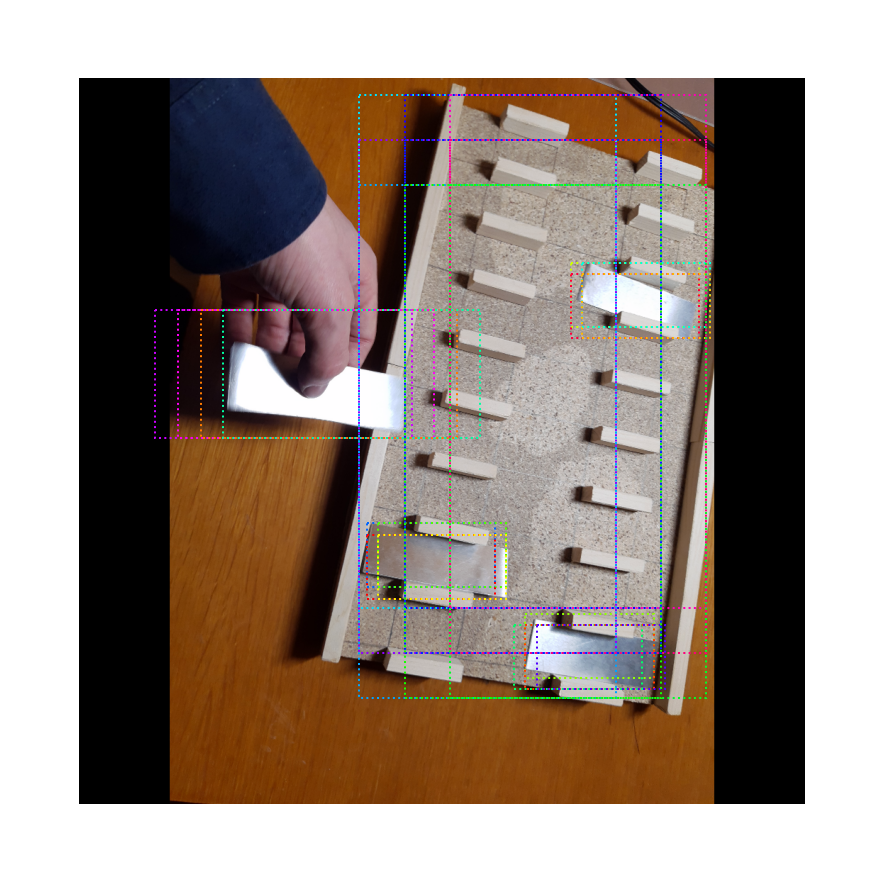

In [ ]:
# Show positive anchors
fig, ax = plt.subplots(1, figsize=(16, 16))
visualize.draw_boxes(sample_image, boxes=anchors[positive_anchor_ids], ax=ax)

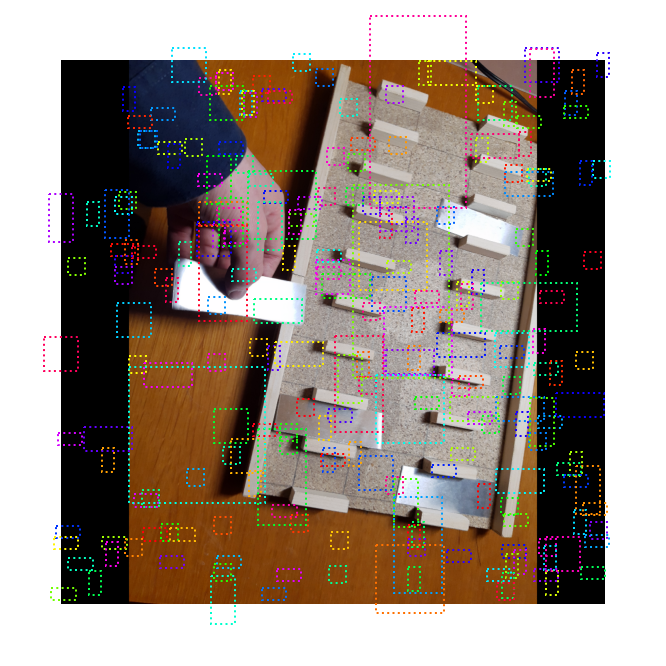

In [ ]:
# Show negative anchors
visualize.draw_boxes(sample_image, boxes=anchors[negative_anchor_ids])

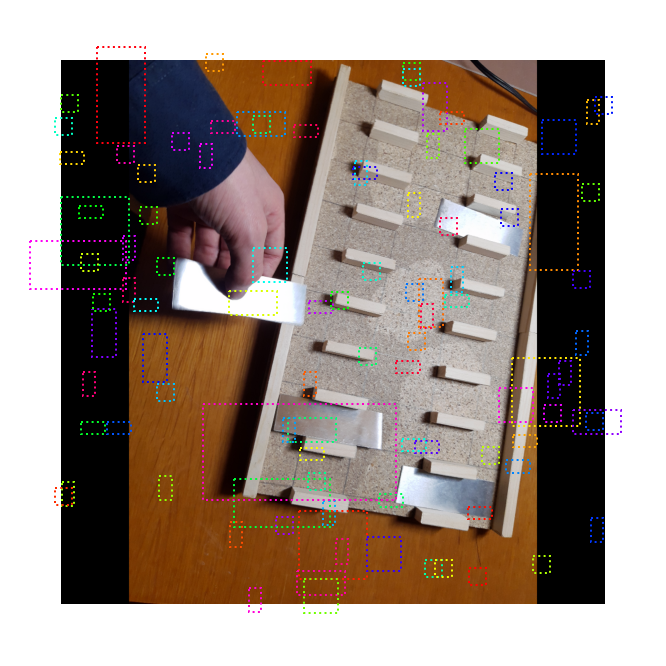

In [ ]:
# Show neutral anchors
visualize.draw_boxes(sample_image, boxes=anchors[np.random.choice(neutral_anchor_ids, 100)])

We can see that the anchors have different sizes and are distributed over the whole image. Noticable is that the anchors overlap which is important for the next steps. 

### 2.3.3 RPN Predictions
The next stage we examine is the prediction of the RPN. 
It makes a prediction for each anchor on an image which looks like this.
We run the RPN graph and display its predictions. 

In [ ]:
## Load an image
#image_id = random.choice(dataset.image_ids)
image_id = 4
image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset, config, image_id, use_mini_mask=False)
info = dataset.image_info[image_id]
print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, 
                                       dataset.image_reference(image_id)))

glue
medienverarbeitung-g-what-should-i-glue/img/val/Pos_12.jpg
image ID: glue.Pos_12.jpg (4) medienverarbeitung-g-what-should-i-glue/img/val/Pos_12.jpg


In [ ]:
# Run RPN sub-graph
pillar = model.keras_model.get_layer("ROI").output  # node to start searching from

# TF 1.4 and 1.9 introduce new versions of NMS. Search for all names to support TF 1.3~1.10
nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression:0")
if nms_node is None:
    nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression/NonMaxSuppressionV2:0")
if nms_node is None: #TF 1.9-1.10
    nms_node = model.ancestor(pillar, "ROI/rpn_non_max_suppression/NonMaxSuppressionV3:0")

rpn = model.run_graph([image], [
    ("rpn_class", model.keras_model.get_layer("rpn_class").output),
    ("pre_nms_anchors", model.ancestor(pillar, "ROI/pre_nms_anchors:0")),
    ("refined_anchors", model.ancestor(pillar, "ROI/refined_anchors:0")),
    ("refined_anchors_clipped", model.ancestor(pillar, "ROI/refined_anchors_clipped:0")),
    ("post_nms_anchor_ix", nms_node),
    ("proposals", model.keras_model.get_layer("ROI").output),
])

rpn_class                shape: (1, 261888, 2)        min:    0.00000  max:    1.00000  float32
pre_nms_anchors          shape: (1, 6000, 4)          min:   -0.35390  max:    1.29134  float32
refined_anchors          shape: (1, 6000, 4)          min: -179.80228  max:  180.93079  float32
refined_anchors_clipped  shape: (1, 6000, 4)          min:    0.00000  max:    1.00000  float32
post_nms_anchor_ix       shape: (663,)                min:    0.00000  max: 5985.00000  int32
proposals                shape: (1, 1000, 4)          min:    0.00000  max:    1.00000  float32


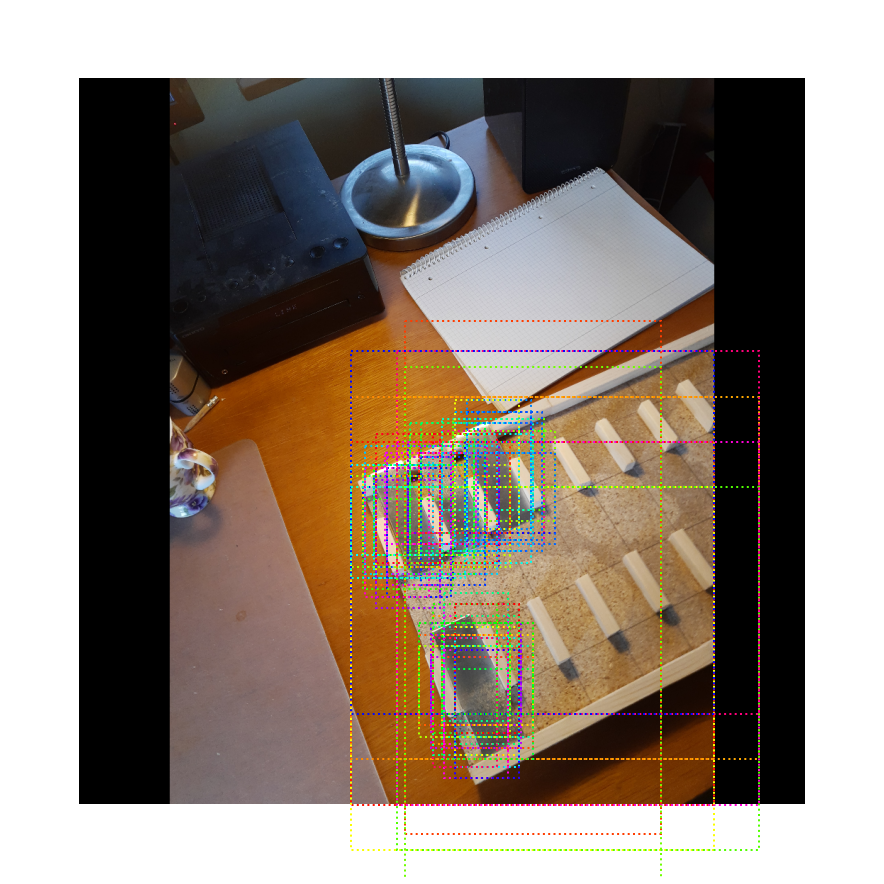

In [ ]:
# Show top anchors by score (before refinement)
limit = 100
sorted_anchor_ids = np.argsort(rpn['rpn_class'][:,:,1].flatten())[::-1]
visualize.draw_boxes(image, boxes=model.anchors[sorted_anchor_ids[:limit]], ax=get_ax())

Here we see the top 100 anchors without any 'correction'. Now we look at the same anchors but with refinement, that means that the RPN regresses a refinement, a delta value in location and size, to shift and resize them to better fit the object. 

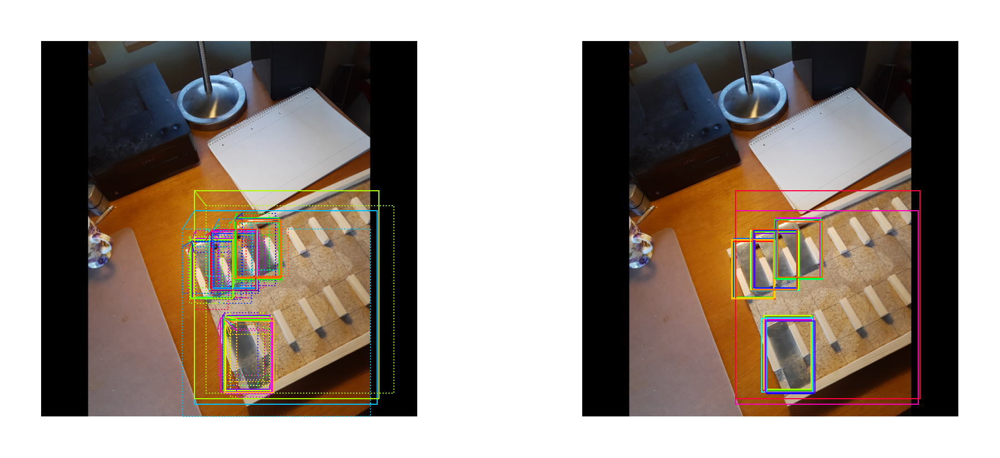

In [ ]:
# Show top anchors with refinement. Then with clipping to image boundaries
limit = 50
ax = get_ax(1, 2)
pre_nms_anchors = utils.denorm_boxes(rpn["pre_nms_anchors"][0], image.shape[:2])
refined_anchors = utils.denorm_boxes(rpn["refined_anchors"][0], image.shape[:2])
refined_anchors_clipped = utils.denorm_boxes(rpn["refined_anchors_clipped"][0], image.shape[:2])
visualize.draw_boxes(image, boxes=pre_nms_anchors[:limit],
                     refined_boxes=refined_anchors[:limit], ax=ax[0])
visualize.draw_boxes(image, refined_boxes=refined_anchors_clipped[:limit], ax=ax[1])

The last step is to apply non-maximum-suppression to restrict the result to the most promising boxes. 

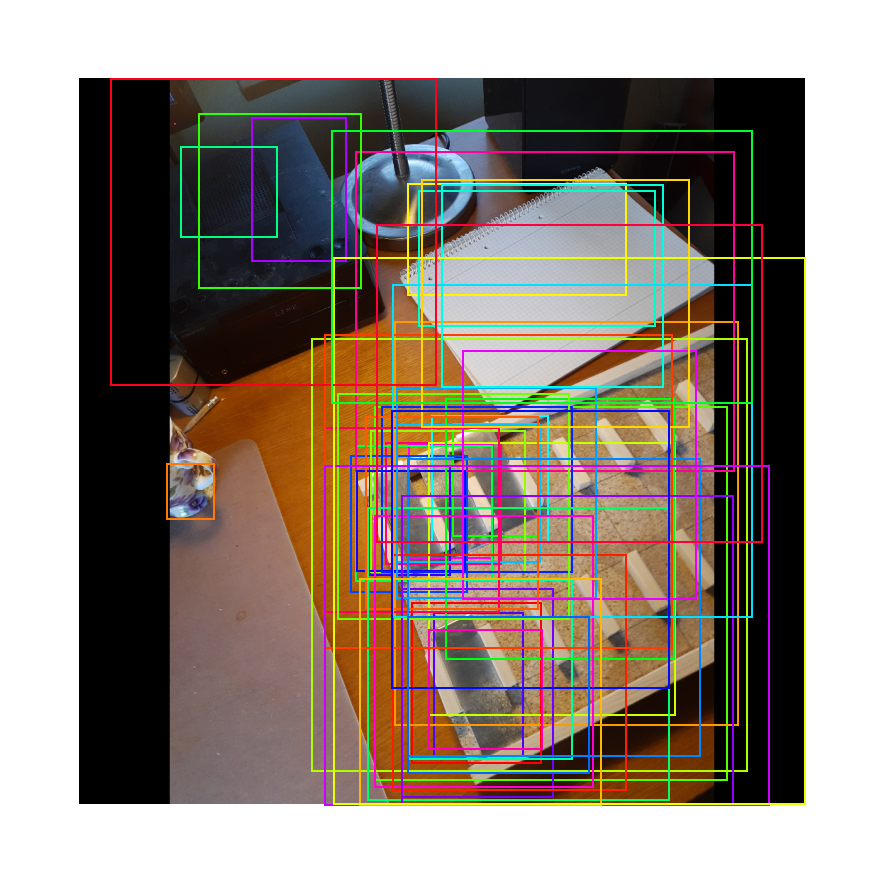

In [ ]:
# Show final proposals
# These are the same as the previous step (refined anchors 
# after NMS) but with coordinates normalized to [0, 1] range.
limit = 50
# Convert back to image coordinates for display
h, w = config.IMAGE_SHAPE[:2]
proposals = rpn['proposals'][0, :limit] * np.array([h, w, h, w])
visualize.draw_boxes(image, refined_boxes=proposals, ax=get_ax())

### 2.3.4 Classification and Bounding-Box Regression
After this we have the result from the first stage, the RPN. These are passed on to the seconde stage, the proposal classification, bounding box regressions and mask generation. 
We begin with the branch for classification and bounding box regressions.
We run the 'branch' on the RPN result of the image and display it.  

In [ ]:
# Get input and output to classifier and mask heads.
mrcnn = model.run_graph([image], [
    ("proposals", model.keras_model.get_layer("ROI").output),
    ("probs", model.keras_model.get_layer("mrcnn_class").output),
    ("deltas", model.keras_model.get_layer("mrcnn_bbox").output),
    ("masks", model.keras_model.get_layer("mrcnn_mask").output),
    ("detections", model.keras_model.get_layer("mrcnn_detection").output),
])

proposals                shape: (1, 1000, 4)          min:    0.00000  max:    1.00000  float32
probs                    shape: (1, 1000, 3)          min:    0.00000  max:    1.00000  float32
deltas                   shape: (1, 1000, 3, 4)       min:   -3.51473  max:    5.25510  float32
masks                    shape: (1, 100, 28, 28, 3)   min:    0.00000  max:    1.00000  float32
detections               shape: (1, 100, 6)           min:    0.00000  max:    2.00000  float32


In [ ]:
# Proposals are in normalized coordinates. Scale them
# to image coordinates.
h, w = config.IMAGE_SHAPE[:2]
proposals = np.around(mrcnn["proposals"][0] * np.array([h, w, h, w])).astype(np.int32)

# Class ID, score, and mask per proposal
roi_class_ids = np.argmax(mrcnn["probs"][0], axis=1)
roi_scores = mrcnn["probs"][0, np.arange(roi_class_ids.shape[0]), roi_class_ids]
roi_class_names = np.array(dataset.class_names)[roi_class_ids]
roi_positive_ixs = np.where(roi_class_ids > 0)[0]

# How many ROIs vs empty rows?
print("{} Valid proposals out of {}".format(np.sum(np.any(proposals, axis=1)), proposals.shape[0]))
print("{} Positive ROIs".format(len(roi_positive_ixs)))

# Class counts
print(list(zip(*np.unique(roi_class_names, return_counts=True))))

663 Valid proposals out of 1000
35 Positive ROIs
[('BG', 965), ('carrier', 22), ('test_piece', 13)]


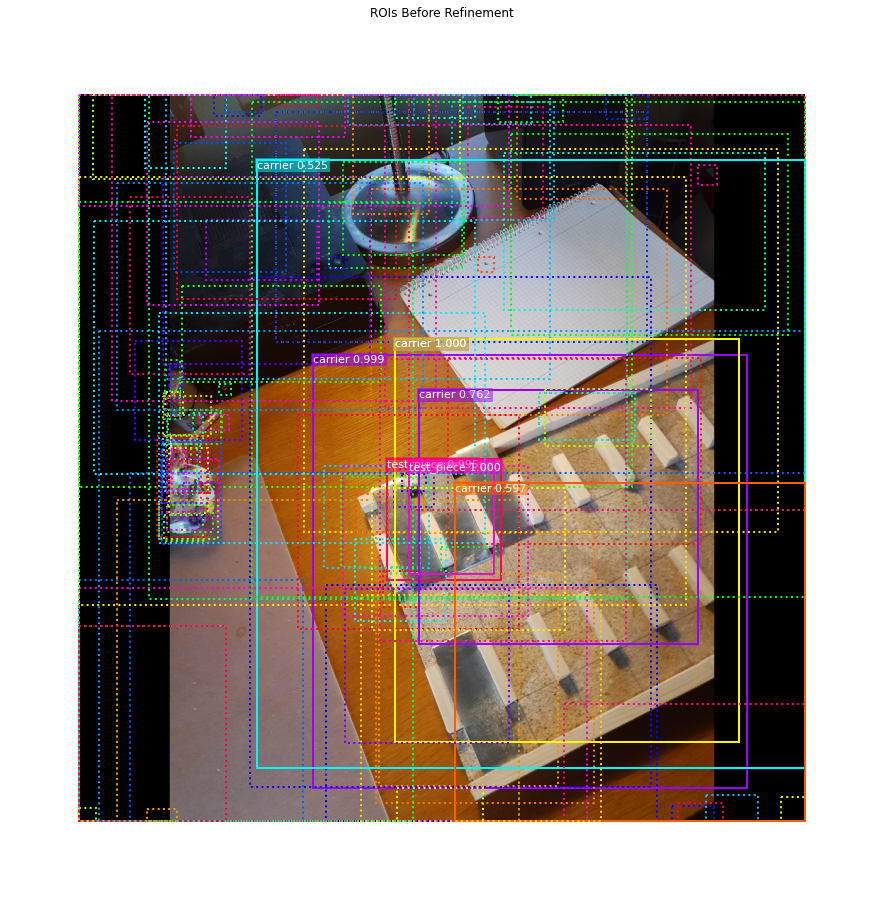

In [ ]:
# Display a random sample of proposals.
# Proposals classified as background are dotted, and
# the rest show their class and confidence score.
limit = 200
ixs = np.random.randint(0, proposals.shape[0], limit)
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[ixs], roi_scores[ixs])]
visualize.draw_boxes(image, boxes=proposals[ixs],
                     visibilities=np.where(roi_class_ids[ixs] > 0, 2, 1),
                     captions=captions, title="ROIs Before Refinement",
                     ax=get_ax())

This looks not to bad, since we have a box and a lable somewhere close around the object but still way to far off.
Now several steps, similar to the ones from the RPN will be performed to refine the bounding boxes. Key difference is that in this part we also take the classes into consideration, e.g. we apply non-maximum suppression per class. 

roi_bbox_specific        shape: (1000, 4)             min:   -2.89857  max:    5.25510  float32
refined_proposals        shape: (1000, 4)             min: -396.00000  max: 1709.00000  int32


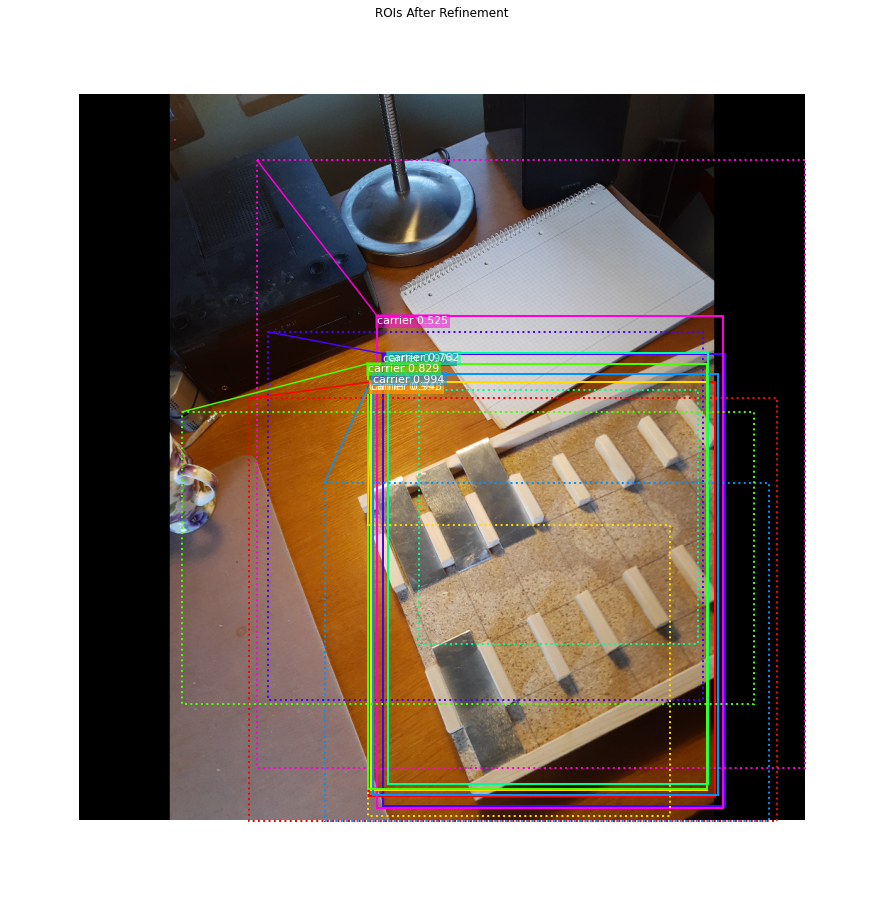

In [ ]:
# Class-specific bounding box shifts.
roi_bbox_specific = mrcnn["deltas"][0, np.arange(proposals.shape[0]), roi_class_ids]
log("roi_bbox_specific", roi_bbox_specific)

# Apply bounding box transformations
# Shape: [N, (y1, x1, y2, x2)]
refined_proposals = utils.apply_box_deltas(
    proposals, roi_bbox_specific * config.BBOX_STD_DEV).astype(np.int32)
log("refined_proposals", refined_proposals)

# Show positive proposals
limit = 7
ids = np.random.randint(0, len(roi_positive_ixs), limit)  # Display random sample
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[roi_positive_ixs][ids], roi_scores[roi_positive_ixs][ids])]
visualize.draw_boxes(image, boxes=proposals[roi_positive_ixs][ids],
                     refined_boxes=refined_proposals[roi_positive_ixs][ids],
                     visibilities=np.where(roi_class_ids[roi_positive_ixs][ids] > 0, 1, 0),
                     captions=captions, title="ROIs After Refinement",
                     ax=get_ax())

This already looks better with the bounding boxes closer to their target. We dont see bounding boxes and labels around all object because we only display a few that the result better visible. 
In the next steps we remove not needed bounding boxes and apply per-class non maximum suppression. 

In [ ]:
# Remove boxes classified as background
keep = np.where(roi_class_ids > 0)[0]
print("Keep {} detections:\n{}".format(keep.shape[0], keep))

Keep 35 detections:
[  0   1   2   3   4   5   6   7   8   9  10  11  12  14  17  18  26  30
  32  34  36  38  40  43  45  52  54  57  74 115 125 241 247 368 658]


In [ ]:
# Remove low confidence detections
keep = np.intersect1d(keep, np.where(roi_scores >= config.DETECTION_MIN_CONFIDENCE)[0])
print("Remove boxes below {} confidence. Keep {}:\n{}".format(
    config.DETECTION_MIN_CONFIDENCE, keep.shape[0], keep))

Remove boxes below 0.7 confidence. Keep 31:
[  0   1   2   3   4   5   6   7   8   9  10  12  17  18  26  30  32  34
  36  38  40  43  45  52  54  57  74 115 125 368 658]


In [ ]:
# Apply per-class non-max suppression
pre_nms_boxes = refined_proposals[keep]
pre_nms_scores = roi_scores[keep]
pre_nms_class_ids = roi_class_ids[keep]

nms_keep = []
for class_id in np.unique(pre_nms_class_ids):
    # Pick detections of this class
    ixs = np.where(pre_nms_class_ids == class_id)[0]
    # Apply NMS
    class_keep = utils.non_max_suppression(pre_nms_boxes[ixs], 
                                            pre_nms_scores[ixs],
                                            config.DETECTION_NMS_THRESHOLD)
    # Map indicies
    class_keep = keep[ixs[class_keep]]
    nms_keep = np.union1d(nms_keep, class_keep)
    print("{:22}: {} -> {}".format(dataset.class_names[class_id][:20], 
                                   keep[ixs], class_keep))

keep = np.intersect1d(keep, nms_keep).astype(np.int32)
print("\nKept after per-class NMS: {}\n{}".format(keep.shape[0], keep))

test_piece            : [ 0  1  2  3  5  6  7  8  9 10 18 32] -> [0 2 1 3]
carrier               : [  4  12  17  26  30  34  36  38  40  43  45  52  54  57  74 115 125 368
 658] -> [12]

Kept after per-class NMS: 5
[ 0  1  2  3 12]


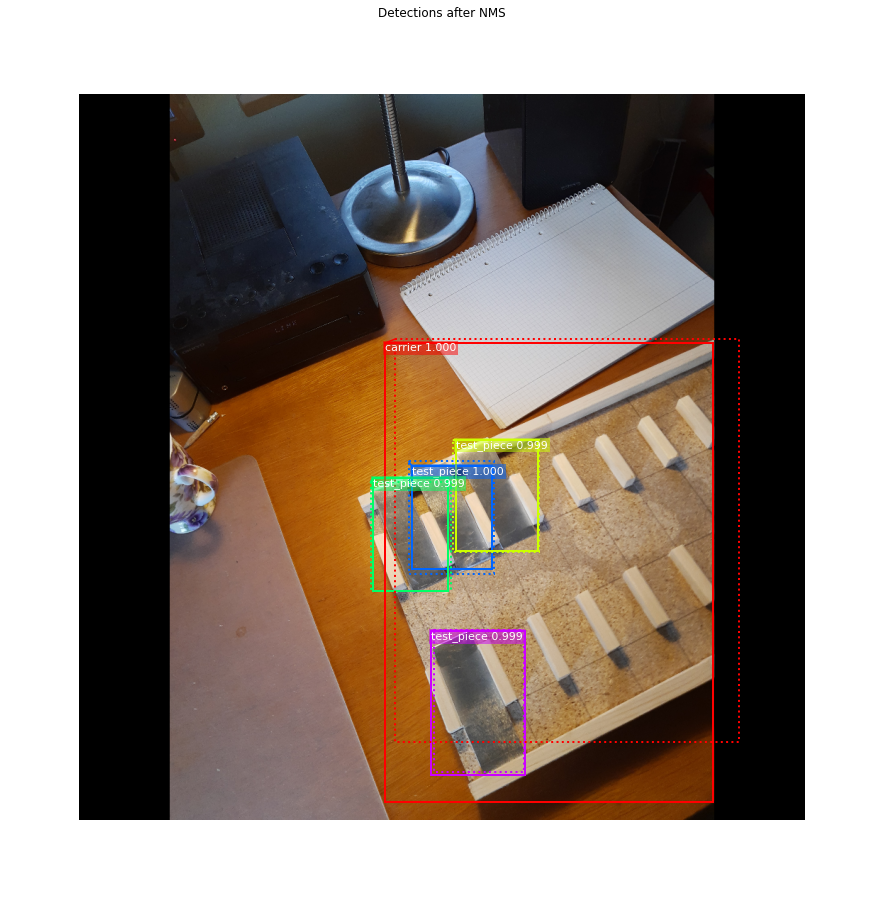

In [ ]:
# Show final detections
ixs = np.arange(len(keep))  # Display all
# ixs = np.random.randint(0, len(keep), 10)  # Display random sample
captions = ["{} {:.3f}".format(dataset.class_names[c], s) if c > 0 else ""
            for c, s in zip(roi_class_ids[keep][ixs], roi_scores[keep][ixs])]
visualize.draw_boxes(
    image, boxes=proposals[keep][ixs],
    refined_boxes=refined_proposals[keep][ixs],
    visibilities=np.where(roi_class_ids[keep][ixs] > 0, 1, 0),
    captions=captions, title="Detections after NMS",
    ax=get_ax())

The result of the non max suppression we can see in this picture. All objects were detected and have the correct class labels. 
Below is the final result.

5 detections: ['carrier' 'test_piece' 'test_piece' 'test_piece' 'test_piece']


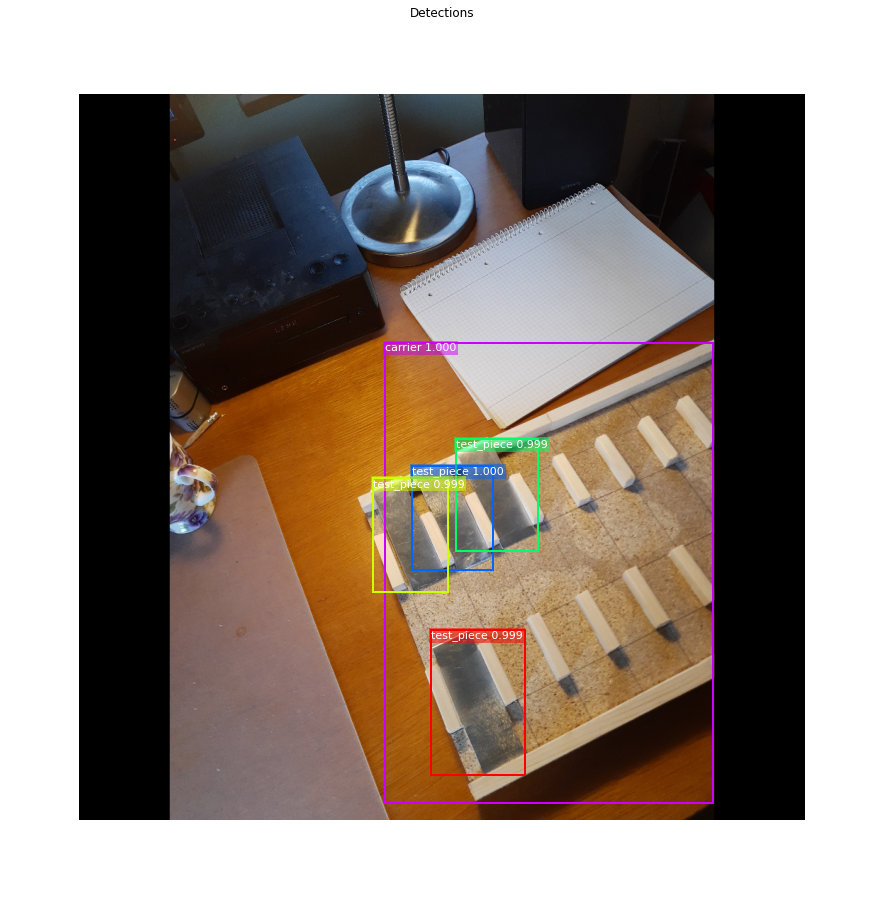

In [ ]:
# Get detection class IDs. Trim zero padding.
det_class_ids = mrcnn['detections'][0, :, 4].astype(np.int32)
det_count = np.where(det_class_ids == 0)[0][0]
det_class_ids = det_class_ids[:det_count]
detections = mrcnn['detections'][0, :det_count]

print("{} detections: {}".format(
    det_count, np.array(dataset.class_names)[det_class_ids]))

captions = ["{} {:.3f}".format(dataset.class_names[int(c)], s) if c > 0 else ""
            for c, s in zip(detections[:, 4], detections[:, 5])]
visualize.draw_boxes(
    image, 
    refined_boxes=utils.denorm_boxes(detections[:, :4], image.shape[:2]),
    visibilities=[2] * len(detections),
    captions=captions, title="Detections",
    ax=get_ax())

### 2.3.5 Mask generation
The next part shows how the mask branch generates its maks. 
In prediction it takes the detected bounding boxes and creates the masks for those. 

In [ ]:
# Masks
det_boxes = utils.denorm_boxes(mrcnn["detections"][0, :, :4], image.shape[:2])
det_mask_specific = np.array([mrcnn["masks"][0, i, :, :, c] 
                              for i, c in enumerate(det_class_ids)])
det_masks = np.array([utils.unmold_mask(m, det_boxes[i], image.shape)
                      for i, m in enumerate(det_mask_specific)])
log("det_mask_specific", det_mask_specific)
log("det_masks", det_masks)

det_mask_specific        shape: (5, 28, 28)           min:    0.00000  max:    1.00000  float32
det_masks                shape: (5, 1024, 1024)       min:    0.00000  max:    1.00000  bool


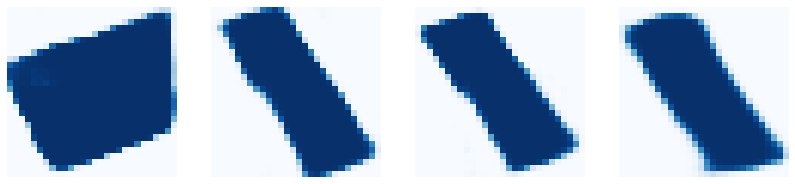

In [ ]:
visualize.display_images(det_mask_specific[:4] * 255, cmap="Blues", interpolation="none")

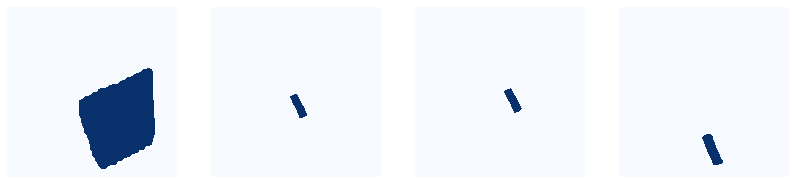

In [ ]:
visualize.display_images(det_masks[:4] * 255, cmap="Blues", interpolation="none")

The resulting mask can be seen in the two images above, the first being the generated mask themselves, the second upscaled to normal image size. 

The last thing we want to discuss before we begin with the training and validation of our models are the preprocessing steps. They are simple but necessary resizing operations for the model to be trained and to work properly. This way it can handle multiple image sizes as input and speeds up the training process without loosing much accuracy. 
We saw the results of this already, the black bar over and below the images. This is due to the method the algorithm uses, it can be specified in the configuration class as well, we use the 'square' method. It scales the images to 1024x1024 images and add zero padding to fullfil the square constraint. 

Similar is done with the masks, which is important to reduce memory usage during training. We can see that we loose a little bit of accuracy but not much. 

image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
image_meta               shape: (15,)                 min:    0.00000  max: 4000.00000  float64
class_ids                shape: (5,)                  min:    1.00000  max:    2.00000  int32
bbox                     shape: (5, 4)                min:  158.00000  max: 1023.00000  int32
mask                     shape: (1024, 1024, 5)       min:    0.00000  max:    1.00000  bool


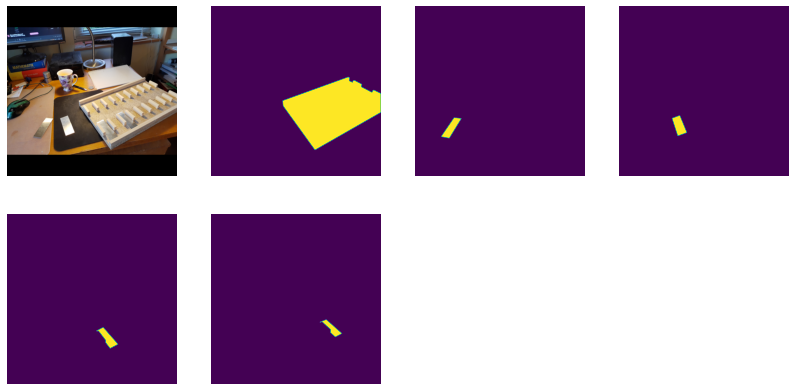

In [ ]:
#image_id = np.random.choice(dataset.image_ids, 1)[0]
image_id = 9
image, image_meta, class_ids, bbox, mask = modellib.load_image_gt(
    dataset, config, image_id, use_mini_mask=False)

log("image", image)
log("image_meta", image_meta)
log("class_ids", class_ids)
log("bbox", bbox)
log("mask", mask)

visualize.display_images([image]+[mask[:,:,i] for i in range(min(mask.shape[-1], 7))])

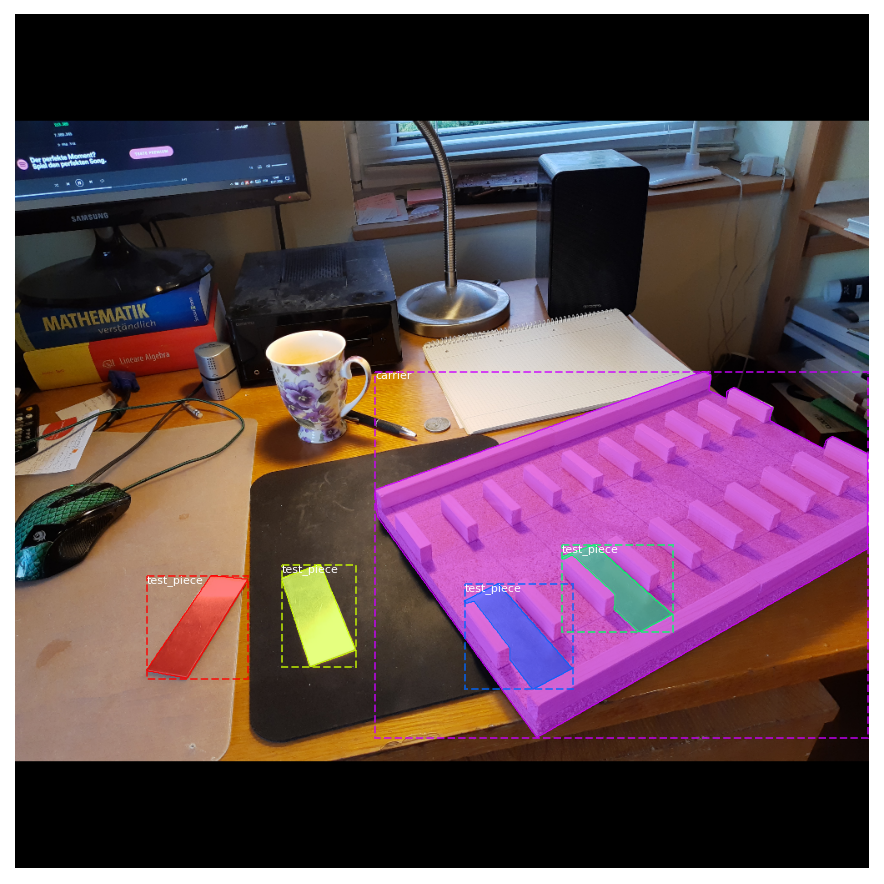

In [ ]:
visualize.display_instances(image, bbox, mask, class_ids, dataset.class_names)

The two images above show the 'perfect' masks without being resized. They fit the object well with distinct edges. 
Now the comparison with the resized masks.  

mask                     shape: (56, 56, 5)           min:    0.00000  max:    1.00000  bool


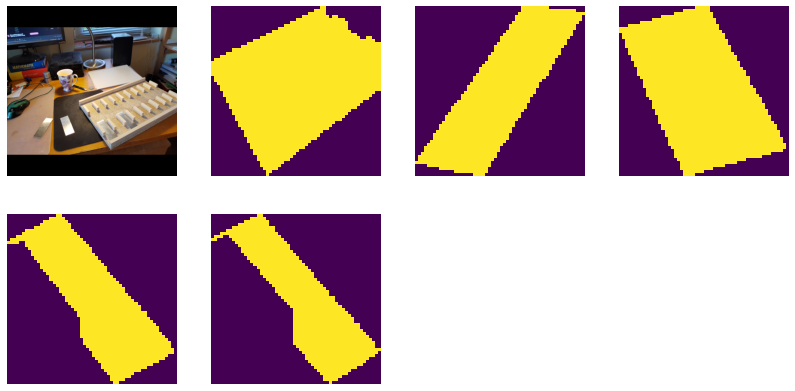

In [ ]:
image, image_meta, class_ids, bbox, mask = modellib.load_image_gt(
    dataset, config, image_id, augment=True, use_mini_mask=True)
log("mask", mask)
visualize.display_images([image]+[mask[:,:,i] for i in range(min(mask.shape[-1], 7))])

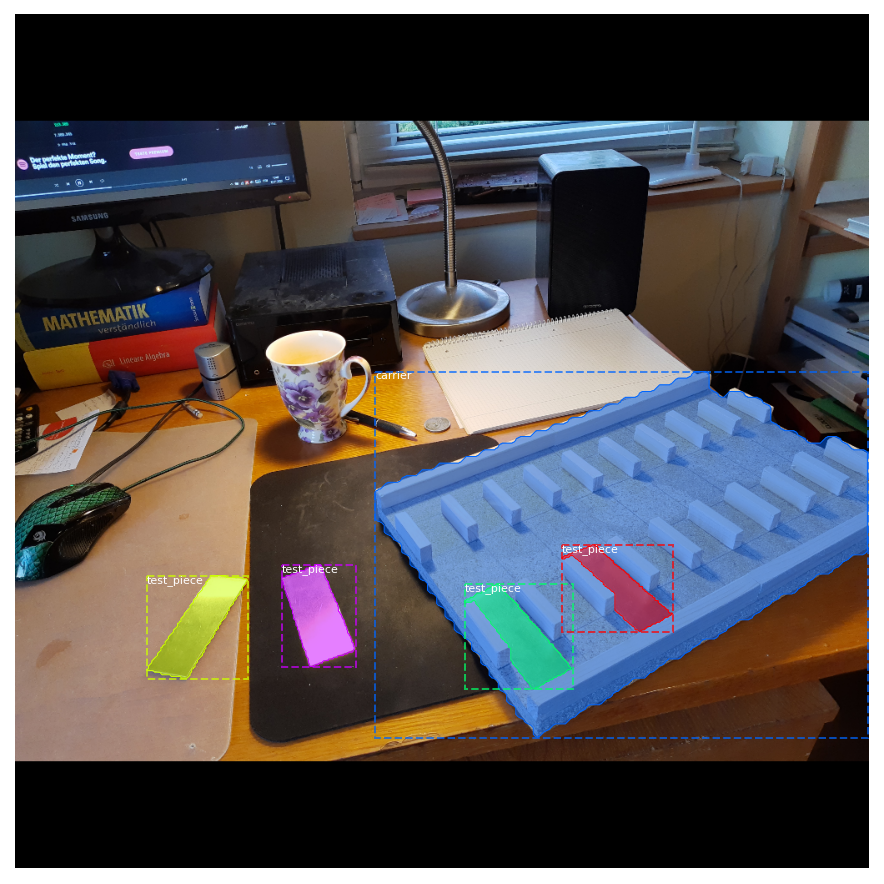

In [ ]:
mask = utils.expand_mask(bbox, mask, image.shape)
visualize.display_instances(image, bbox, mask, class_ids, dataset.class_names)

In this two images with resized masks the edges are jagged but the instances are still segmented pretty well. Finally we will see what the result of all that together is by using the model on an image and displaying the result. 

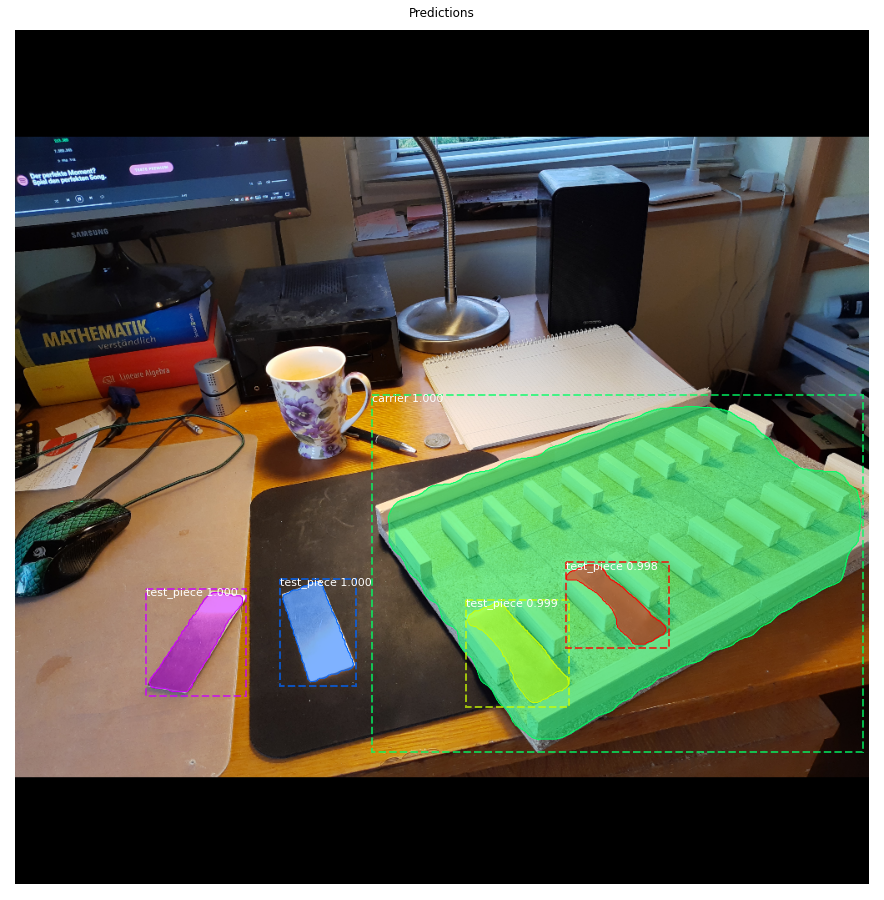

In [ ]:
# Run object detection
results = model.detect([image], verbose=0)

# Display results
ax = get_ax(1)
r = results[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                            dataset.class_names, r['scores'], ax=ax,
                            title="Predictions")

### 2.3.6 Mask-RCNN training

In this section we discuss how we trained our model with different configurations and how we evaluated them. We will include the code we used once and insert the graphs for evaluation with coresponding labels for different configurations as images. 
To accelerate the training time and increase the models accuracy we used transfere learning with pretrained weights on the coco dataset. 
To compare our different configuration we used that as a starting point. 

First we do load our GlueConfig class and training and validation datasets and create a new model with the pretrained weights on the coco dataset. You can also load a previosly trained model and continue training that. Each epoch a model is saved to 'log' path. 

In [ ]:
config = GlueConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     2
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.9
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 2
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                15
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE         

In [ ]:
dataset_train = GlueDataset()
dataset_train.load_glue(GLUE_DIR, "pos")
dataset_train.prepare()

dataset_val = GlueDataset()
dataset_val.load_glue(GLUE_DIR, "val")
dataset_val.prepare()

Loading GLue, my own load_glue
Loading GLue, my own load_glue


In [ ]:
weights_path = COCO_WEIGHTS_PATH
print("Loading weights:", weights_path)
print("Model dir:", MODEL_DIR)

Loading weights: Mask_RCNN/mask_rcnn_coco.h5
Model dir: /content/Mask_RCNN/logs


In [ ]:
model = modellib.MaskRCNN(mode="training", config=config,
                                  model_dir=MODEL_DIR)

In [ ]:
model.load_weights(weights_path, by_name=True, exclude=[
            "mrcnn_class_logits", "mrcnn_bbox_fc",
            "mrcnn_bbox", "mrcnn_mask"])

After we loaded our model we can start training. Here we can easily add image augmentation[12], increase epochs and select which layers we want to train. Other adjustments are done in the GlueConfig class. 

In [ ]:
print("Training network")
model.train(dataset_train, dataset_val,
            learning_rate=config.LEARNING_RATE,
            epochs=10,                             
            layers='heads', # layer='heads' / 'all'
            augmentation = imgaug.augmenters.Sometimes(0.5, [
                   imgaug.augmenters.Fliplr(0.5),
                   imgaug.augmenters.GaussianBlur(sigma=(0.0, 5.0))
                   #imgaug.augmenters.Affine(rotate=(-45, 45)),
                   #imgaug.augmenters.AdditiveGaussianNoise(scale=0.1*255, per_channel=True)...
              ]))

Training network heads

Starting at epoch 0. LR=0.001

Checkpoint Path: /content/Mask_RCNN/logs/glue20210212T1444/mask_rcnn_glue_{epoch:04d}.h5
Selecting layers to train
fpn_c5p5               (Conv2D)
fpn_c4p4               (Conv2D)
fpn_c3p3               (Conv2D)
fpn_c2p2               (Conv2D)
fpn_p5                 (Conv2D)
fpn_p2                 (Conv2D)
fpn_p3                 (Conv2D)
fpn_p4                 (Conv2D)
In model:  rpn_model
    rpn_conv_shared        (Conv2D)
    rpn_class_raw          (Conv2D)
    rpn_bbox_pred          (Conv2D)
mrcnn_mask_conv1       (TimeDistributed)
mrcnn_mask_bn1         (TimeDistributed)
mrcnn_mask_conv2       (TimeDistributed)
mrcnn_mask_bn2         (TimeDistributed)
mrcnn_class_conv1      (TimeDistributed)
mrcnn_class_bn1        (TimeDistributed)
mrcnn_mask_conv3       (TimeDistributed)
mrcnn_mask_bn3         (TimeDistributed)
mrcnn_class_conv2      (TimeDistributed)
mrcnn_class_bn2        (TimeDistributed)
mrcnn_mask_conv4       (TimeDistrib

/usr/local/lib/python3.6/dist-packages/tensorflow_core/python/framework/indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/usr/local/lib/python3.6/dist-packages/tensorflow_core/python/framework/indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/usr/local/lib/python3.6/dist-packages/tensorflow_core/python/framework/indexed_slices.py:424: UserWarning: Converting sparse IndexedSlices to a dense Tensor of unknown shape. This may consume a large amount of memory.
  "Converting sparse IndexedSlices to a dense Tensor of unknown shape. "
/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:1987: UserWarning: Using a generator with `use_multiprocessi

Epoch 1/10
 99/100 [============================>.] - ETA: 3s - loss: 2.0056 - rpn_class_loss: 0.0801 - rpn_bbox_loss: 0.4670 - mrcnn_class_loss: 0.3222 - mrcnn_bbox_loss: 0.5485 - mrcnn_mask_loss: 0.5878

/usr/local/lib/python3.6/dist-packages/keras/engine/training.py:2142: UserWarning: Using a generator with `use_multiprocessing=True` and multiple workers may duplicate your data. Please consider using the`keras.utils.Sequence class.
  UserWarning('Using a generator with `use_multiprocessing=True`'


100/100 [==============================] - 1032s - loss: 1.9982 - rpn_class_loss: 0.0796 - rpn_bbox_loss: 0.4668 - mrcnn_class_loss: 0.3204 - mrcnn_bbox_loss: 0.5467 - mrcnn_mask_loss: 0.5846 - val_loss: 1.3257 - val_rpn_class_loss: 0.0366 - val_rpn_bbox_loss: 0.3143 - val_mrcnn_class_loss: 0.2457 - val_mrcnn_bbox_loss: 0.3673 - val_mrcnn_mask_loss: 0.3617
Epoch 2/10
100/100 [==============================] - 473s - loss: 1.1169 - rpn_class_loss: 0.0421 - rpn_bbox_loss: 0.2840 - mrcnn_class_loss: 0.2000 - mrcnn_bbox_loss: 0.3014 - mrcnn_mask_loss: 0.2895 - val_loss: 1.1465 - val_rpn_class_loss: 0.0304 - val_rpn_bbox_loss: 0.3084 - val_mrcnn_class_loss: 0.1786 - val_mrcnn_bbox_loss: 0.3386 - val_mrcnn_mask_loss: 0.2904
Epoch 3/10
100/100 [==============================] - 459s - loss: 1.0587 - rpn_class_loss: 0.0313 - rpn_bbox_loss: 0.2860 - mrcnn_class_loss: 0.1956 - mrcnn_bbox_loss: 0.2741 - mrcnn_mask_loss: 0.2717 - val_loss: 0.9290 - val_rpn_class_loss: 0.0285 - val_rpn_bbox_loss: 0

The next step is to evaluate our trained model. 
Therefore we gather in the following section information like the training loss and accuracy. Later we will discuss the results. 
We cann look at the loss using tensorboard.

In [ ]:
import tensorflow as tf
%load_ext tensorboard
#%reload_ext tensorboard

In [ ]:
%tensorboard --logdir # dir of tf.eventFile

ERROR: Failed to launch TensorBoard (exited with 1).
Contents of stderr:
Error: A logdir or db must be specified. For example `tensorboard --logdir mylogdir` or `tensorboard --db sqlite:~/.tensorboard.db`. Run `tensorboard --helpfull` for details and examples.

To calculate our accuracy we have to load our config for inferencing again as well as reload the model for inferencing. 

In [ ]:
config = InferenceConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  1024
IMAGE_META_SIZE                15
IMAGE_MIN_DIM                  800
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1024 1024    3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE         

In [ ]:
DEVICE = "/gpu:0" 
with tf.device(DEVICE):
    model = modellib.MaskRCNN(mode="inference", config=config,
                              model_dir=MODEL_DIR)






Instructions for updating:
keep_dims is deprecated, use keepdims instead
Instructions for updating:
keep_dims is deprecated, use keepdims instead

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Instructions for updating:
box_ind is deprecated, use box_indices instead


Instructions for updating:
Use `tf.cast` instead.


Here we created a function that loads our models for all epochs we trained it and then compute the accuracy for the training and the validation data. It computes the accuracy for different values (.5 - .95) for Intersection over Union (IoU). That means for different 'precisions', how much predicted bounding boxes have to intersect with ground truth bounding boxes.

In [ ]:
def train_val_accuracy(cnt_epochs):
  train_accuracy = []
  val_accuracy = []
  for i in range(cnt_epochs): 
    if i < 10: 
      WEIGHTS_PATH = "mask_rcnn_glue_000{}.h5".format(i) 
      print(WEIGHTS_PATH)
    else: 
      WEIGHTS_PATH = "mask_rcnn_glue_00{}.h5".format(i)
      print(WEIGHTS_PATH)
    model.load_weights(WEIGHTS_PATH, by_name=True)
    print("Loaded weights: {}".format(i))
    
    APs_val = []
    for i in dataset_val.image_ids:
      image, gt_image_meta, gt_class_ids, gt_bbox, gt_mask = modellib.load_image_gt(dataset_val, config, i)
      result = model.detect([image], verbose=0)
      r = result[0]
      AP = utils.compute_ap_range(gt_bbox, gt_class_ids, gt_mask, r["rois"], r["class_ids"], r["scores"], r['masks'])
      AP = np.mean(AP)
      APs_val.append(AP)
    mAP_val = np.mean(APs_val)
    print("mAP_val ", mAP_val)
    val_accuracy.append(mAP_val)
    
    APs_train = []
    for i in dataset_train.image_ids:
      image, gt_image_meta, gt_class_ids, gt_bbox, gt_mask = modellib.load_image_gt(dataset_train, config, i)
      result = model.detect([image], verbose=0)
      r = result[0]
      AP = utils.compute_ap_range(gt_bbox, gt_class_ids, gt_mask, r["rois"], r["class_ids"], r["scores"], r['masks'])
      AP = np.mean(AP)
      APs_train.append(AP)
    mAP_train = np.mean(APs_train)
    print("mAP_train ", mAP_train)
    train_accuracy.append(mAP_val)
  return train_accuracy, val_accuracy

In [ ]:
cnt_epochs = 10
train_acc, val_acc = train_val_accuracy(cnt_epochs)

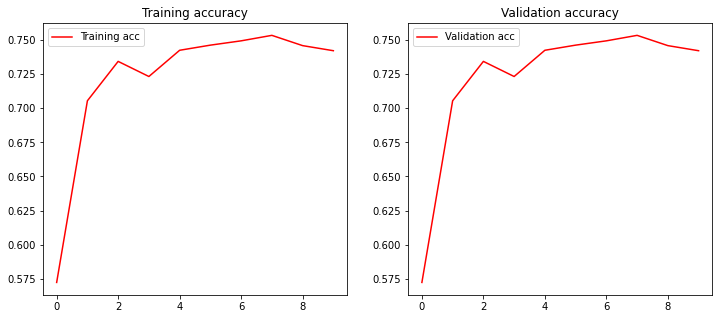

In [ ]:
x = range(0, cnt_epochs)
plt.figure(figsize=(12, 5))
plt.subplot(121)
plt.plot(x, train_acc, 'r', label='Training acc')
plt.title('Training accuracy')
plt.legend()
plt.subplot(122)
plt.plot(x, val_acc, 'r', label='Validation acc')
plt.title('Validation accuracy')
plt.legend()

Here we see the plots of the accuracy. Below we finally watch at the prediction for an image that we can actually see wether the models is any good. 

glue
/content/Mask_RCNN/img/val/Pos_66.jpg
image ID: glue.Pos_66.jpg (21) /content/Mask_RCNN/img/val/Pos_66.jpg
Processing 1 images
image                    shape: (1024, 1024, 3)       min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 1024, 1024, 3)    min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 15)               min:    0.00000  max: 1024.00000  int64
anchors                  shape: (1, 261888, 4)        min:   -0.35390  max:    1.29134  float32
gt_class_id              shape: (2,)                  min:    1.00000  max:    2.00000  int32
gt_bbox                  shape: (2, 4)                min:  354.00000  max: 1023.00000  int32
gt_mask                  shape: (1024, 1024, 2)       min:    0.00000  max:    1.00000  bool


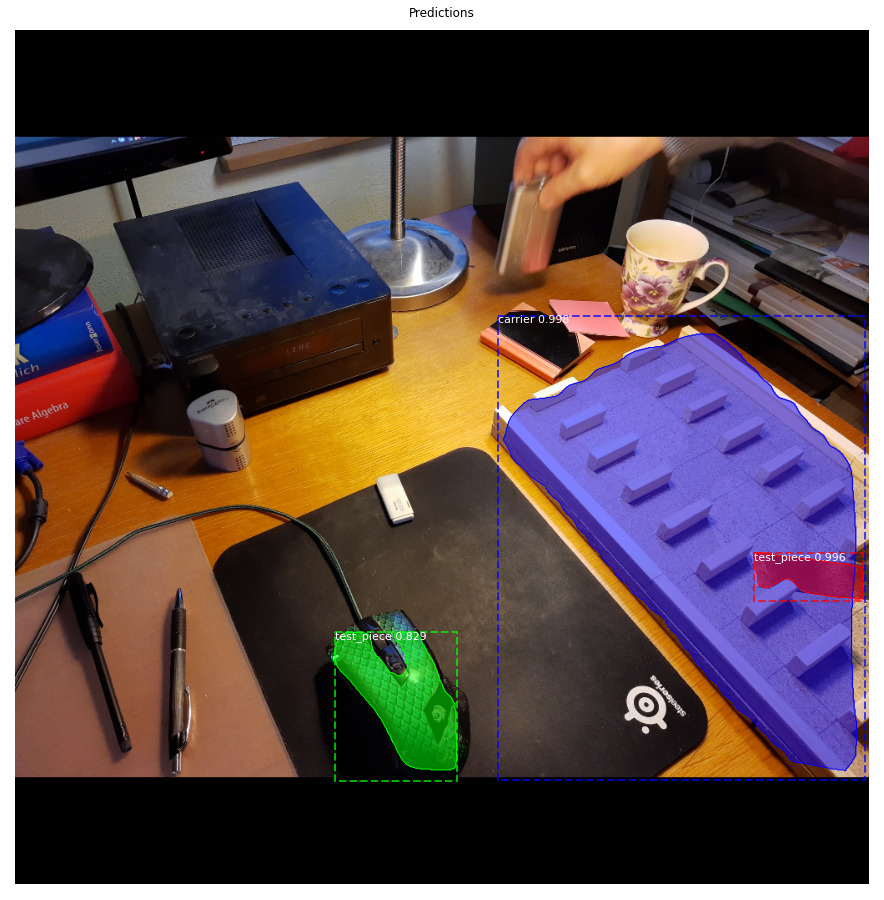

In [ ]:
image_id = 21
image, image_meta, gt_class_id, gt_bbox, gt_mask =\
    modellib.load_image_gt(dataset_val, config, image_id, use_mini_mask=False)
info = dataset_val.image_info[image_id]
print("image ID: {}.{} ({}) {}".format(info["source"], info["id"], image_id, 
                                       dataset_val.image_reference(image_id)))
# Run object detection
results = model.detect([image], verbose=1)

# Display results
ax = get_ax(1)
r = results[0]
visualize.display_instances(image, r['rois'], r['masks'], r['class_ids'], 
                            dataset_val.class_names, r['scores'], ax=ax,
                            title="Predictions")
log("gt_class_id", gt_class_id)
log("gt_bbox", gt_bbox)
log("gt_mask", gt_mask)

### 2.3.7 Mask R-CNN Evaluation 

In this part we evaluate the models by looking at the graphs for Accuracy and Loss. 
We wont show each single graph we obtained since most of them are very similar. We chose those most representative for our compared parameters. 
We used the first configuration as our base model to compare other configurations with, only changing one parameter at a time or changing the size of our dataset. 

First we will look at the loss of the trained models though not for each layer.

![alt text](https://raw.githubusercontent.com/uol-mediaprocessing-202021/medienverarbeitung-g-what-should-i-glue/main/for_colab_final/loss.jpg)

As we can see in the graphs of the combined losses most curves are very similar to each other. The most significant difference is how low the loss got. We obtained our best results with a subset of our current dataset, training all layers of the model without any augmentation nor preprocessing.

Next we will look at the accuracy of the different models as a mean of different IoU[13,14], from .5 to .95. Here we compare six different configurations. Our base model, two different configurations of image augmentation, as well as two types of image preprocessing and wether we train all layers or only the heads.

![alt text](https://raw.githubusercontent.com/uol-mediaprocessing-202021/medienverarbeitung-g-what-should-i-glue/main/for_colab_final/accuracy_01vs02.jpg)
![alt text](https://raw.githubusercontent.com/uol-mediaprocessing-202021/medienverarbeitung-g-what-should-i-glue/main/for_colab_final/accuracy_03vs2.2.jpg)
![alt text](https://raw.githubusercontent.com/uol-mediaprocessing-202021/medienverarbeitung-g-what-should-i-glue/main/for_colab_final/accuracy_05vs06.jpg)

Here again, as we could already see in the graphs of the losses, the best performing model is the one where we train all layers without any augmentation nor preprocessing, reaching an accuracy of 85%. We confirmed this by creating videos combined with the tracker from the next part in our elaboration. 

We can conclude, that preprocessing does not help much in improving the accuracy of our model, at least not during early training phase. The same for the image augmentation though the results there where much more promising than with preprocessing, reaching higher accuracy but also with more inconsistency. Increasing the size of our dataset brought us to where image augmentation got us in the early training stage accuracy wise. 
Because of those results our next steps in improving our model are adapting its learning rate and use augmentation in later stages to prevent overfitting. 



## 2.4 YOLO

# 3. Tracking 

We now have already implemented two different methods to detect our test pieces in images, but we still need a solution to track the instances over several images in a video or live feed. 
Miscellaneos methods do exist solving this most of them having further advantages like reducing false positives. The approach we chose is called centroid tracking. We chose it because it is a simple, straight forward method we could implement ourselves with the advantage that adapting it to both object detection framework is simple. Also other trackers as alternatives like KCF (Kernelized Correlation Filters) cant recover from full occlusion which is very likely to occur when reaching somewhere with your hand[6,7]. 

![alt text](https://raw.githubusercontent.com/uol-mediaprocessing-202021/medienverarbeitung-g-what-should-i-glue/main/for_colab_final/id_switching.JPG)

But also to mention are the disatvantages of the centroid tracker that are ID-Switching and that the object detector has to run every frame. ID-Switching is a conceptual problem and it occurs when two seperate tracked pieces come to close together. Then the tracker can lose the right instance to its ID and switch them. You can see this in this image, where the new distances are shorter for the wrong objects, object 01 will be assigned to a and 02 to b. This could probably be improve with the use of heuristics. 

Centroid tracking is a 'Tracking by Detection' method. That describes an approach where the objectdetector has to analyse every single frame and based on those results the tracking algorithm can calculate the identity of an object and track it. 
The algorithm calculates the center of each bounding box found by the object detector. Those points are the location of the object and are compared with the centroids of the next frames. 
Next it calculates the euclidean distance between all centroids from the previous and current frame. This is simply done with Pythagorean theorem. 
After this, it updates the location of the centroids, each centroid from the last frame gets assigned to the closest centroid from the current frame[6].

We implemented this in the class CentroidTracker in the code block below. Since it holds all informations about the objects it was extended to add the detections, the bounding boxes and segments, to the image as well next to the centroids themselves. This makes it possible to display the segments and bounding boxes only if the centroid to that object exists and prevents false positives to be displayed for the 'user'. It also adds the overlay to display the steps for the 'user' of the AR application. This is only implemented provisionally, for a proper solution the detection modell has to be adapted to detect the tasks as well e.g. if glue was applied. 

 



In [ ]:
import math

# config values
start_value = 25  
remove_value = 0
display_thresh_value = 50
maxDistance = 300

class CentroidTracker: 
  def __init__(self):
    self.nextID = 0     # nextID for new centroids to be added
    self.centroids = [] # centroids are stored in a list of dicts with all necessary informations


  def addCentroid(self, cen): # this adds a new centroid / object
    self.centroids.append(cen)
    self.nextID += 1

  def insertCentroid(self, cen): # method to 'update' an entry
    for nr, c in enumerate(self.centroids):
      if c['id'] == cen['id']:
        self.centroids[nr] = cen
        break

  def noUpdate(self): # This checks if an object was updated, removes if not updated for to long 
    for cen in self.centroids: 
      if cen['updated'] == False:
        cen['age'] -= 5
      cen['updated'] = False
    self.removeCentroid()

  def removeCentroid(self): # removes centroid from list
    for cen in self.centroids: 
      if cen['age'] <= remove_value:
        self.centroids.remove(cen) 

  def centroid_xy_of_bbox(self, box): # returns centroid coordinates as integers
    y1, x1, y2, x2 = box
    xx = int((x1 + x2) / 2)
    yy = int((y1 + y2) / 2)
    return xx,yy

  def distance(self, box): # computes the distance between a single centroid and closest predecessor, also returns some other useful informations
    xx,yy = self.centroid_xy_of_bbox(box)
    tmp = None
    tmp_closest = None
    tmp_age = None
    tmp_updated = None
    tmp_t_on_carrier = None
    for c in self.centroids:
      d = math.sqrt((xx - c['x'])**2 + (yy - c['y'])**2)
      if tmp == None or tmp > d:
        tmp = d
        tmp_closest = c['id']
        tmp_age = c['age'] + 1
        tmp_updated = c['updated']
        tmp_t_on_carrier = c['t_on_carrier']
    return tmp, tmp_closest, xx, yy, tmp_age, tmp_updated, tmp_t_on_carrier

 
  def updateCentroids(self, bboxes, masks, class_ids): # updates the datastructure, the important part 
    M = len(self.centroids)
    N = len(bboxes)
    if M == 0:
      for nr, b in enumerate(bboxes): 
        xx,yy = self.centroid_xy_of_bbox(b)  
        cent = {'id': self.nextID, 'x': xx, 'y': yy, 'age': start_value, 'updated': True, 'cur_bbox_id': b, 'cur_mask': masks[:, :, nr], 'cur_class_id': class_ids[nr], 't_on_carrier':0}
        self.addCentroid(cent)
    else:
      if M==N or M > N:
        for nr, box in enumerate(bboxes):     
          tmp_dist, tmp_id, xx, yy, tmp_age,_, tmp_on_carrrier = self.distance(box)
          if tmp_dist >= maxDistance:
            continue
          cent = {'id': tmp_id, 'x': xx, 'y': yy, 'age': tmp_age + 1, 'updated': True, 'cur_bbox_id': box, 'cur_mask': masks[:, :, nr], 'cur_class_id': class_ids[nr], 't_on_carrier': tmp_on_carrrier}
          self.insertCentroid(cent)
      else:        
        for nr, box in enumerate(bboxes):     
            tmp_dist, tmp_id, xx, yy, tmp_age, tmp_updated, tmp_on_carrrier = self.distance(box)
            if tmp_dist >= maxDistance:
              continue
            if tmp_updated == True: # if more bounding boxes are found than in the prev frame register the new objects, not overwrite best solution (might be improved)
              cent = {'id': self.nextID, 'x': xx, 'y': yy, 'age': start_value, 'updated': True, 'cur_bbox_id': box, 'cur_mask': masks[:, :, nr], 'cur_class_id': class_ids[nr], 't_on_carrier':tmp_on_carrrier}              
              self.addCentroid(cent)
            else: 
              cent = {'id': tmp_id, 'x': xx, 'y': yy, 'age': tmp_age + 1, 'updated': True, 'cur_bbox_id': box, 'cur_mask': masks[:, :, nr], 'cur_class_id': class_ids[nr], 't_on_carrier': tmp_on_carrrier}
              self.insertCentroid(cent)


  def intersection(self, bboxes, class_ids, image):
    tmp_trays = []
    for c in self.centroids:
        if c['cur_class_id'] == 2: # c equals carrier
          tmp_trays.append(c)
    
    if len(tmp_trays) > 1: # with this it only works for one single tray, could be improved to work with more 
        image = cv2.putText(image, "Only one tray at a time.", (50,50), cv2.FONT_HERSHEY_SIMPLEX , 1, (255, 255, 255), 2)
        return image
    if len(tmp_trays) == 0: 
        return image
    
    not_intersecting = []
    pieces_on_carrier = []
    y1, x1, y2, x2 = tmp_trays[0]['cur_bbox_id']
    for c in self.centroids:
        if c['cur_class_id'] == 1: # c equals test_piece
            xx = c['x']
            yy = c['y']
            if (xx > x1 and xx < x2): 
              if (yy > y1 and yy < y2):
                if c['t_on_carrier'] > 250: 
                  pass
                else: 
                  c['t_on_carrier'] += 1
                if c['t_on_carrier'] > 20 and c['t_on_carrier'] < 150:
                  pieces_on_carrier.append(str(c['id']))
                continue
            not_intersecting.append(str(c['id'])) 
    if len(not_intersecting) > 0:
      name_ids = ", ".join(not_intersecting)
      text = "Place these Pieces on Tray: " + name_ids
      image = cv2.putText(image, text, (50, 50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
    if len(pieces_on_carrier) > 0:
      name_ids = ", ".join(pieces_on_carrier)
      text = "Add glue to: " + name_ids
      image = cv2.putText(image, text, (50, 200), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 255), 2)
    return image

    
  def display_bboxes_masks(self, image, colors, display_bbox=False):
    masked_image = image.copy()

    for cen in self.centroids:
      if cen['age'] >= display_thresh_value and cen['updated'] == True:
          if cen['cur_class_id'] == 1:
            color = colors[0]
          else:
            color = colors[1]            
          if not np.any(cen['cur_bbox_id']):
          # Skip this instance. Has no bbox. Likely lost in image cropping.
            continue
          if display_bbox == True: 
              y1, x1, y2, x2 =cen['cur_bbox_id']
              masked_image = cv2.rectangle(masked_image, (x1, y1), (x2, y2), color, 2)            
          # Mask
          masked_image = visualize.apply_mask(masked_image, cen['cur_mask'], color)
    return masked_image

  def displayCentroids(self, image): # displays centroids as cicle with 'id' as text
    for c in self.centroids: 
      if c['age'] >= display_thresh_value: 
        image = cv2.circle(image, (c['x'], c['y']), 10, (0, 0, 255), -1)
        if c['t_on_carrier'] > 250: 
          image = cv2.putText(image, "Done", (c['x'], c['y']), cv2.FONT_HERSHEY_SIMPLEX , 1, (255, 255, 255), 2)
        else:
          image = cv2.putText(image, str(c['id']), (c['x'], c['y']), cv2.FONT_HERSHEY_SIMPLEX , 1, (255, 255, 255), 2) 
    return image

This is a function similar to the one in the tracker to display the segments and bounding boxes predicted by the model, only without regard to the tracking informations. False positives will be shown. 


In [ ]:
def display_bboxes_masks(image, bboxes, masks, class_ids, colors, display_bbox=False):
  N = bboxes.shape[0]
  if not N:
    pass
    #print("\n*** No instances to display *** \n")
  else:
    assert bboxes.shape[0] == masks.shape[-1] == class_ids.shape[0]  # check if an error occured and shapes are not equal 

  masked_image = image.copy()
  for i in range(N):
    if class_ids[i] == 1:
      color = colors[0]
    else:
      color = colors[1]
    
    if not np.any(bboxes[i]):
    # Skip this instance. Has no bbox. Likely lost in image cropping.
      continue
    if display_bbox == True: 
        y1, x1, y2, x2 = bboxes[i]
        masked_image = cv2.rectangle(masked_image, (x1, y1), (x2, y2), color, 2)

    # Mask
    mask = masks[:, :, i]
    masked_image = visualize.apply_mask(masked_image, mask, color)

  return masked_image



The next thing we need to do is either load a video or acces the webcam to get live video input. 
To display, however, and to access the webcam we had to use java script. After trying to solve this on our own by adapting a colab code snippet, we made a thorough search in the web and could find a solution which[8]. With that we could get this running in colab as well, which we had to, since neither of us had the hardware to run any of the objectdetectors locally.  

In [ ]:
# from https://colab.research.google.com/github/vindruid/yolov3-in-colab/blob/master/yolov3_streaming_webcam.ipynb#scrollTo=--5V5bcxqDAZ
# to display video in colab
import base64
import html
import io
import time

from IPython.display import display, Javascript
from google.colab.output import eval_js
import numpy as np
from PIL import Image
import cv2

def start_input():
  js = Javascript('''
    var video;
    var div = null;
    var stream;
    var captureCanvas;
    var imgElement;
    var labelElement;
    
    var pendingResolve = null;
    var shutdown = false;
    
    function removeDom() {
       stream.getVideoTracks()[0].stop();
       video.remove();
       div.remove();
       video = null;
       div = null;
       stream = null;
       imgElement = null;
       captureCanvas = null;
       labelElement = null;
    }
    
    function onAnimationFrame() {
      if (!shutdown) {
        window.requestAnimationFrame(onAnimationFrame);
      }
      if (pendingResolve) {
        var result = "";
        if (!shutdown) {
          captureCanvas.getContext('2d').drawImage(video, 0, 0, video.videoWidth, video.videoHeight);
          result = captureCanvas.toDataURL('image/jpeg', 0.8) // way faster if < 1
        }
        var lp = pendingResolve;
        pendingResolve = null;
        lp(result); // as long it is not terminated it takes a new image, except its not ready 
      }
    }
    
    async function createDom() {
      if (div !== null) {
        return stream;
      }

      div = document.createElement('div');
      div.style.border = '2px solid black';
      div.style.padding = '3px';
      div.style.width = '100%';
      div.style.maxWidth = '600px';
      document.body.appendChild(div);
      
      const modelOut = document.createElement('div');
      modelOut.innerHTML = "<span>Status:</span>";
      labelElement = document.createElement('span');
      labelElement.innerText = 'No data';
      labelElement.style.fontWeight = 'bold';
      modelOut.appendChild(labelElement);
      div.appendChild(modelOut);
           
      video = document.createElement('video');
      video.style.display = 'block';
      video.width = div.clientWidth - 6;
      video.setAttribute('playsinline', '');
      video.onclick = () => { shutdown = true; };
      stream = await navigator.mediaDevices.getUserMedia(
          {video: { facingMode: "environment"}});
      div.appendChild(video);

      imgElement = document.createElement('img');
      imgElement.style.position = 'absolute';
      imgElement.style.zIndex = 1;
      imgElement.onclick = () => { shutdown = true; };
      div.appendChild(imgElement);
      
      const instruction = document.createElement('div');
      instruction.innerHTML = 
          '<span style="color: red; font-weight: bold;">' +
          'When finished, click here or on the video to stop this demo</span>';
      div.appendChild(instruction);
      instruction.onclick = () => { shutdown = true; };
      
      video.srcObject = stream;
      await video.play();

      captureCanvas = document.createElement('canvas');
      captureCanvas.width = video.videoWidth; 
      captureCanvas.height = video.videoHeight; 
      window.requestAnimationFrame(onAnimationFrame);
      
      return stream;
    }
    async function takePhoto(label, imgData) {
      if (shutdown) {
        removeDom();
        shutdown = false;
        return '';
      }

      var preCreate = Date.now();
      stream = await createDom();
      
      var preShow = Date.now();
      if (label != "") {
        labelElement.innerHTML = label;
      }
            
      if (imgData != "") {
        var videoRect = video.getClientRects()[0];
        imgElement.style.top = videoRect.top + "px";
        imgElement.style.left = videoRect.left + "px";
        imgElement.style.width = videoRect.width + "px";
        imgElement.style.height = videoRect.height + "px";
        imgElement.src = imgData;
      }
      
      var preCapture = Date.now();
      var result = await new Promise(function(resolve, reject) {
        pendingResolve = resolve;
      });
      shutdown = false;
      
      return {'create': preShow - preCreate, 
              'show': preCapture - preShow, 
              'capture': Date.now() - preCapture,
              'img': result};
    }
    ''')

  display(js)
  
def take_photo(label, img_data):
  data = eval_js('takePhoto("{}", "{}")'.format(label, img_data))
  return data


def js_reply_to_image(js_reply):
    """
    input: 
          js_reply: JavaScript object, contain image from webcam

    output: 
          image_array: image array RGB size 512 x 512 from webcam
    """
    jpeg_bytes = base64.b64decode(js_reply['img'].split(',')[1])
    image_PIL = Image.open(io.BytesIO(jpeg_bytes))
    image_array = np.array(image_PIL)

    return image_array


def drawing_array_to_bytes(drawing_array):
    """
    input: 
          drawing_array: image RGBA size 512 x 512 
                              contain bounding box and text from yolo prediction, 
                              channel A value = 255 if the pixel contains drawing properties (lines, text) 
                              else channel A value = 0

    output: 
          drawing_bytes: string, encoded from drawing_array
    """

    drawing_PIL = Image.fromarray(drawing_array, 'RGB')
    iobuf = io.BytesIO()
    drawing_PIL.save(iobuf, format='png')
    drawing_bytes = 'data:image/png;base64,{}'.format((str(base64.b64encode(iobuf.getvalue()), 'utf-8')))
    return drawing_bytes

Here we load a video and convert it to be saved with predictions of the model or we can use the model to run on webcam input and display results in colab. Unfortunately we cant save the webcam video. 

In [ ]:
!wget -O exampleVID_Glue.mp4 https://cloudstorage.elearning.uni-oldenburg.de/s/t5oS8KdjLBmF6t3/download

In [ ]:
# Mask R-CNN object detector
import cv2
import datetime
import time
from google.colab.patches import cv2_imshow
from matplotlib import pyplot as plt
%matplotlib inline

webcam_or_video  = False  # True for webcam, false for video 
display_in_colab = False  # True to display webcam feed, cant with video as input for now
save_video       = True   # right now, can only save a video when using a video as input


# load tracker, webcam or video and VideoWriter
class_names = ['test_piece', 'carrier']
colors = visualize.random_colors(len(class_names))
tracker = CentroidTracker()
times = []

if webcam_or_video == False: 
  video_path = 'exampleVID_Glue.mp4'  
  video = cv2.VideoCapture(video_path)
  video_width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
  video_height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))
  fps = video.get(cv2.CAP_PROP_FPS)

else:
  start_input()
  label_html = 'Capturing...'
  img_data = ''

if save_video == True:
  file_name = "mask_rcnn_detection_video_{:%Y%m%dT%H%M%S}.avi".format(datetime.datetime.now())
  vwriter = cv2.VideoWriter(file_name,
                            cv2.VideoWriter_fourcc('M','J','P','G'), 
                            fps, (video_width, video_height))


while True:
    if webcam_or_video == False:
      ok, frame = video.read()
      if not ok: 
          print("Cannot read video file, or Video reached its end")
          break
    else: 
      js_reply = take_photo(label_html, img_data)
      if not js_reply:
          break
      frame = js_reply_to_image(js_reply)

    start_time = time.time()
    results = model.detect([frame], verbose=0)  # run object detection 
    r = results[0] 
      
    # update frame with results from detection 
    tracker.updateCentroids(r['rois'], r['masks'], r['class_ids'])
    augmented_image = tracker.display_bboxes_masks(frame, colors, True)
    augmented_image = tracker.displayCentroids(augmented_image)
    augmented_image = tracker.intersection(r['rois'], r['class_ids'], augmented_image)
    tracker.noUpdate()
    res_time = 1.0 / (time.time() - start_time)
    times.append(res_time)

    if display_in_colab == True:
        drawing_bytes = drawing_array_to_bytes(augmented_image)
        img_data = drawing_bytes
    
    if save_video == True:
        vwriter.write(augmented_image)


print('Average FPS: ', sum(times)/len(times))
if webcam_or_video == False:
  video.release()
if save_video == True:
  vwriter.release()


Cannot read video file, or Video reached its end
Average FPS:  1.4339427945349217


In this image you can see how our final result looks like. It shows the detected objects with different colors for different classes. In this picture we also show the bounding boxes, they are usefull to see wether a test piece is on the carrier or not. Every detected and tracked object has a centroid with its current id displayed. In the top left corner you can see the next steps for the adhesive testing task. 
If the test is completed the test pieces display 'Done'. 

![alt text](https://raw.githubusercontent.com/uol-mediaprocessing-202021/medienverarbeitung-g-what-should-i-glue/main/for_colab_final/final_predictions_mask.JPG)

# 4. Reflection and Conclusion

In the course of working on the "What Should I Glue" project, we noticed that it was sometimes difficult to translate our ideas into practice. We, for example, thought that the Open CV functions for object detection, such as Canny or Houghlines, would complete our goal of locating objects in an image. 


Due to the fact that the components, which are made of aluminium, reflect light, we faced the challenge of detecting with the result of some test pieces being grayish on the one end and white on the other.

Therefore, we had to dismiss the idea of completing the project with available Open CV functions and work ourselves into machine learning algorithms, in this case Mask R-CNN and YOLO. The results of the machine learning algorithms were significantly better in the matter of detecting objects.

While implementing, Mask R-CNN we had some issues with python, tensorflow and keras. We needed specific versions to run the code which were not the ones named in the framework, the named version did not work for us. Solving this, costed a lot of time, but in the end with colab we got it to run. 
However, using colab as our platform for programming, Github became redundant since colab automatically saves the progress when linked to Google Drive. Thus, adding it to Github is not convenient anymore.

It is also important to mention that despite the possibilities offered by MS Teams, Colab, Github etc., communication in the group was much more complicated. As a matter of fact, the coordination of such a project requires more effort compared to the usual collaboration in person.

In the end, however, we were able to reach the desired goal with our methods. We could detect and track test pieces in images and video sequences for our own trained setup. Further, we achieved to display the steps in adhesive testing and created an AR assistance application for adhesive testing. 


# 5. Vision

To further expand this project, the machine learning model can be improved by increasing the amount of images that the dataset contains as well as improving image augmentation. This will lead to a higher variety of images such as lighting, perspective, resolution or focus, thus ameliorating the training results. Although it will most likely be necessary to train the models much longer to achieve that. 

In addidtion to that, a more complex work routine can be designed and implemented, to display the usecase of this project. Let the ML models detect the different steps in the work routine and display them accordingly. 

Another part of the project that, with more research and testing, could be more efficient is the preprocessing. There are many more methods that could be looked at for better results e.g. otsu's thresholding technique, houghlines or morphological operations.

Furthermore, the tracking algorithm could be improved using some heuristics to prevent ID-switching. Also other tracking algorithms could be implemented to compare their performances and perhaps choose a more efficient algorithm. 

# 6. References

[1] https://arxiv.org/pdf/1611.10012.pdf
   (speed tradeofs of ml object detectors)

[2] https://arxiv.org/pdf/1703.06870.pdf
   (mask-rcnn)

[3] https://arxiv.org/pdf/1506.01497.pdf
   (faster-rcnn)

[4] https://github.com/matterport/ (Mask R-CNN framework, 14.02.2021)

[5] https://engineering.matterport.com/splash-of-color-instance-segmentation-with-mask-r-cnn-and-tensorflow-7c761e238b46

[6] https://www.pyimagesearch.com/2018/07/23/simple-object-tracking-with-opencv/ (14.02.2021)

[7] https://learnopencv.com/object-tracking-using-opencv-cpp-python/%5D (14.02.2021)

[8] https://colab.research.google.com/github/vindruid/yolov3-in-colab/blob/master/yolov3_streaming_webcam.ipynb#scrollTo=--5V5bcxqDAZ (14.02.2021)

[9] https://machinelearningmastery.com/object-recognition-with-deep-learning/ (A gentle introduction to object recognition with deep learning, 14.02.2021)

[10] https://jonathan-hui.medium.com/understanding-feature-pyramid-networks-for-object-detection-fpn-45b227b9106c (14.02.2021)

[11] https://machinethink.net/blog/object-detection/ (14.02.2021)

[12] https://imgaug.readthedocs.io/en/latest/source/overview_of_augmenters.html (14.02.2021) 

[13] https://towardsdatascience.com/intersection-over-union-iou-calculation-for-evaluating-an-image-segmentation-model-8b22e2e84686 (14.02.2021)

[14] https://towardsdatascience.com/accuracy-precision-recall-or-f1-331fb37c5cb9 (14.02.2021)

[15] https://de.wikipedia.org/wiki/Kalman-Filter (14.02.2021)

[16] https://www.pyimagesearch.com/2014/11/10/histogram-oriented-gradients-object-detection/ (14.02.2021)

[17] https://www.pyimagesearch.com/2015/05/25/basic-motion-detection-and-tracking-with-python-and-opencv/ (14.02.2021)

[18] https://towardsdatascience.com/yolo-you-only-look-once-3dbdbb608ec4 (14.02.2021)

[19] https://docs.opencv.org/3.4/d7/d4d/tutorial_py_thresholding.html (14.02.2021)

[20] https://docs.opencv.org/master/da/d22/tutorial_py_canny.html (14.02.2021)

[21] https://docs.opencv.org/master/d4/d13/tutorial_py_filtering.html (14.02.2021)
